In [1]:
# This cell connects to google drive, authenticates connection, and iterates over file list displaying each file's title and ID.
# it also imports and installs all the necessary libraries
!pip install -U -q PyDrive
!pip install -U -q wordcloud
!pip install -U -q bokeh
!pip install textblob
!pip install sklearn

import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns

from bs4 import BeautifulSoup

from wordcloud import WordCloud
from scipy.stats import hmean
from scipy.stats import norm
from pylab import *
from bokeh.plotting import figure
from bokeh.io import output_notebook, show
from bokeh.models import LinearColorMapper
from bokeh.models import HoverTool

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

from textblob import TextBlob
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

from time import time

  

     |████████████████████████████████| 435 kB 7.3 MB/s 
     |████████████████████████████████| 18.5 MB 2.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
panel 0.12.1 requires bokeh<2.4.0,>=2.3.0, but you have bokeh 2.4.3 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
%cd /content/drive/My Drive/Colab Notebooks/

/content/drive/My Drive/Colab Notebooks


# **Reading dataset**




In [7]:
df_news= data = pd.read_csv('Dataset_For_Project/clean_timesofindia_for_topic_modeling.csv')
df_news

,text,target
0,mp to study new motor act before implementing ...,Negative
1,bhujbal says higher power rate driving industr...,Negative
2,mandira bedi shares a monochrome picture in a ...,Negative
3,harassment in office dm seeks action taken re...,Negative
4,two students end their lives mumbai,Negative
...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive
62960,going to india gate tonight? you could be in f...,Positive
62961,; cops to ensure safe new year celebrations in...,Positive
62962,ten more private trains from mumbai on cards m...,Positive


# **Topic Modeling 4**

In [8]:
num_topics=4

In [9]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [10]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [11]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 8.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=a2353160823acd16b4a311c61a11aa5d2ec03a3cb028ec323b80725ea64d2999
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [12]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/p

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0      269.562408 -124.803398       1        1  28.846898
1        1.782994 -295.079681       2        1  25.072329
2      220.811432 -343.832123       3        1  23.864127
3       50.533993  -76.050934       4        1  22.216647, topic_info=                Term         Freq        Total Category  logprob  loglift
4599   entertainment  6767.000000  6767.000000  Default  30.0000  30.0000
3684           delhi  5202.000000  5202.000000  Default  29.0000  29.0000
6689           india  7164.000000  7164.000000  Default  28.0000  28.0000
2113        business  3643.000000  3643.000000  Default  27.0000  27.0000
9138          mumbai  3771.000000  3771.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
15424          water   729.710417   987.496166   Topic4  -5.0422   1.2018
1492       bengaluru  1019.589828  2331.275362   Topic4  -4.7077   0.6773
2683            city   547.805753   891.719652   Topic4  -5.3290   1.0171
5606            gets   558.442566  1017.196316   Topic4  -5.3097   0.9047
9439             new   499.264032  1862.771213   Topic4  -5.4218   0.1876

[180 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
436        2  0.999502   ahmedabad
458        2  0.998066         air
1063       3  0.997993  aurangabad
1488       3  0.995953      bengal
1489       1  0.997751     bengali
...      ...       ...         ...
15580      4  0.035292       woman
15583      1  0.997751       women
15609      1  0.999258       world
15685      2  0.999479        year
15687      4  0.999624       years

[173 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4])

In [13]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['tv', 'events', 'india', 'sports', 'movies', 'bollywood', 'news', 'hindi', 's', 'entertainment']


Top 10 words for topic #1:
['home', 'nagpur', 'year', 's', 'ahmedabad', 'pune', 'chennai', 'hyderabad', 'mumbai', 'delhi']


Top 10 words for topic #2:
['bengaluru', 'style', 's', 'lucknow', 'chandigarh', 'patna', 'life', 'goa', 'business', 'india']


Top 10 words for topic #3:
['crore', 'bhopal', 'bengaluru', 'cm', 'road', 'rs', 'jaipur', 'kolkata', 'citizen', 'stories']




In [14]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [15]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,3
1,bhujbal says higher power rate driving industr...,Negative,3
2,mandira bedi shares a monochrome picture in a ...,Negative,0
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,1
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,0
62960,going to india gate tonight? you could be in f...,Positive,2
62961,; cops to ensure safe new year celebrations in...,Positive,1
62962,ten more private trains from mumbai on cards m...,Positive,1


In [16]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [17]:
df_topic.Topic = df_topic.Topic.astype(str)


In [18]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [19]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_4.csv', index = False, encoding='utf-8')

# **LSA**

In [20]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [21]:
reindexed_data=df_news.text
n_topics=num_topics

In [22]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [23]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [24]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [25]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [26]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [27]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [28]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business rs sports world goa bengaluru new hyderabad says
Topic 2:  entertainment hindi news bollywood lucknow movies tv life style events
Topic 3:  delhi ahmedabad man patna year kolkata held government chennai chandigarh
Topic 4:  mumbai citizen stories pune chennai hyderabad jaipur water chandigarh road


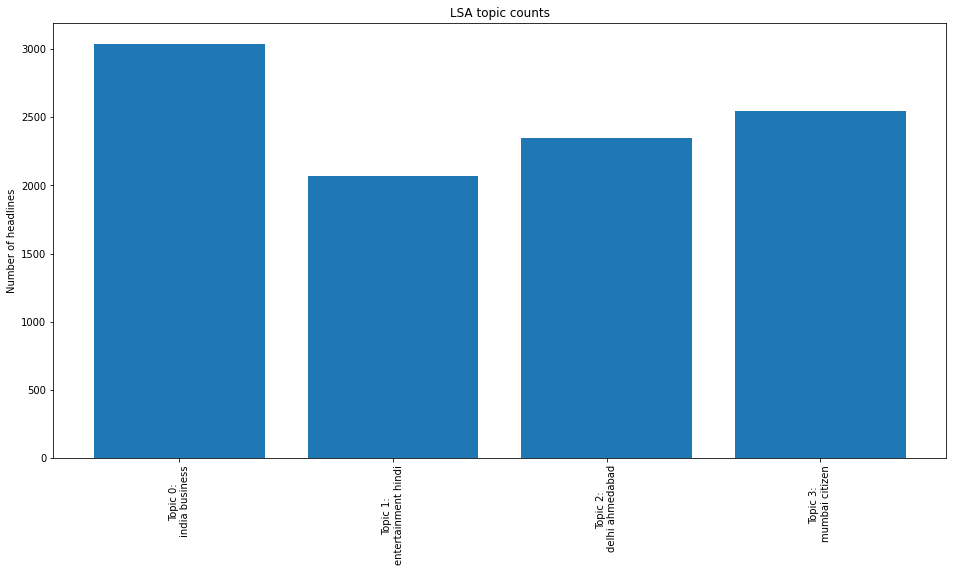

In [29]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [30]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.009s...
[t-SNE] Computed neighbors for 10000 samples in 0.833s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.004646
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.271301
[t-SNE] KL divergence after 2000 iterations: 0.878604


In [31]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [32]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [33]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [34]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [35]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [36]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india delhi business chennai pune kolkata rs chandigarh bengaluru jaipur
Topic 2:  citizen stories goa patna lucknow style life entertainment events road
Topic 3:  entertainment hindi news bollywood movies hyderabad ahmedabad tv tamil kannada
Topic 4:  mumbai india hyderabad sports world bjp chandigarh maharashtra cup says


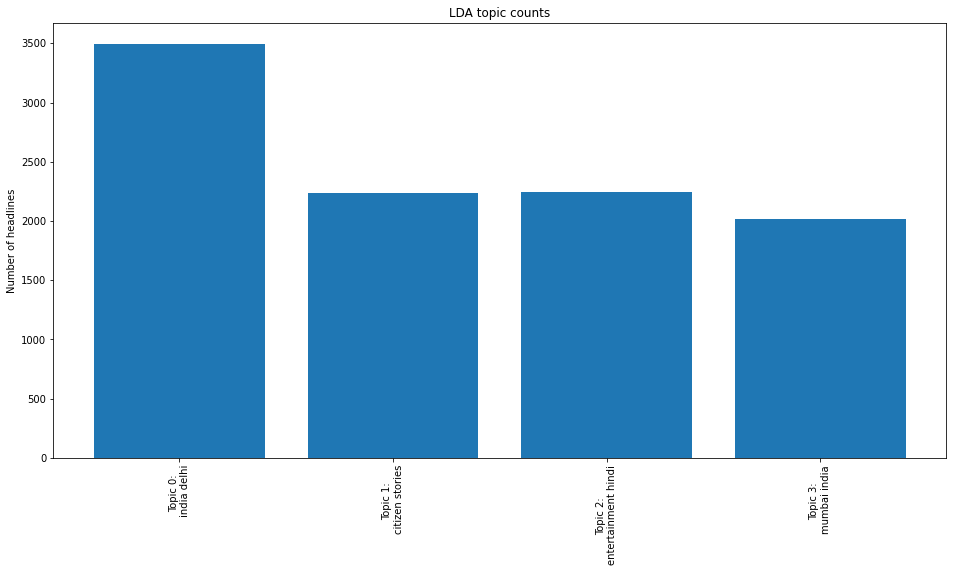

In [37]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [38]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.008s...
[t-SNE] Computed neighbors for 10000 samples in 0.341s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.000520
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.757263
[t-SNE] KL divergence after 2000 iterations: 0.516955


In [39]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 6**

In [40]:
num_topics=6

In [41]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [42]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [43]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [44]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
0       1.465019 -47.625065       1        1  18.753710
1      54.854797 -36.476795       2        1  17.755644
2      32.212929 -61.444572       3        1  17.492304
3       5.111096 -14.110332       4        1  16.906851
5      26.350170 -33.374702       5        1  15.930634
4      38.109818  -7.222781       6        1  13.160858, topic_info=                Term         Freq        Total Category  logprob  loglift
3684           delhi  4987.000000  4987.000000  Default  30.0000  30.0000
6689           india  7313.000000  7313.000000  Default  29.0000  29.0000
4599   entertainment  7190.000000  7190.000000  Default  28.0000  28.0000
9447            news  4037.000000  4037.000000  Default  27.0000  27.0000
6271           hindi  4072.000000  4072.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
6196            held   761.588095  1152.539308   Topic6  -4.4759   1.6136
3145            cops   509.602119   832.140734   Topic6  -4.8777   1.5376
12414         school   400.695519   581.603123   Topic6  -5.1181   1.6553
8394             man   366.463587  1187.697263   Topic6  -5.2074   0.8521
12375           says   366.340543  1422.953745   Topic6  -5.2077   0.6710

[260 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
255        3  0.998062     action
417        6  0.997946       agra
436        2  0.400453  ahmedabad
436        6  0.599025  ahmedabad
458        2  0.998919        air
...      ...       ...        ...
15583      5  0.999335      women
15598      2  0.998780       work
15609      4  0.999309      world
15685      1  0.999577       year
15687      1  0.999214      years

[252 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 6, 5])

In [45]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['thiruvananthapuram', 'bjp', 'old', 'gets', 'kochi', 'year', 's', 'bollywood', 'hindi', 'entertainment']


Top 10 words for topic #1:
['high', 'ahmedabad', 's', 'students', 'nagpur', 'chennai', 'hyderabad', 'pune', 'mumbai', 'delhi']


Top 10 words for topic #2:
['tv', 'events', 'lucknow', 'patna', 'movies', 'goa', 'citizen', 'stories', 'entertainment', 'news']


Top 10 words for topic #3:
['cm', 's', 'government', 'hyderabad', 'world', 'rs', 'jaipur', 'sports', 'bengaluru', 'india']


Top 10 words for topic #4:
['meet', 'madurai', 'gurgaon', 'held', 'dehradun', 'woman', 't', 'bhopal', 'ahmedabad', 'kolkata']


Top 10 words for topic #5:
['modi', 'pm', 'noida', 'home', 'chandigarh', 's', 'style', 'life', 'business', 'india']




In [46]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [47]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,3
1,bhujbal says higher power rate driving industr...,Negative,4
2,mandira bedi shares a monochrome picture in a ...,Negative,0
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,2
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,5
62960,going to india gate tonight? you could be in f...,Positive,5
62961,; cops to ensure safe new year celebrations in...,Positive,0
62962,ten more private trains from mumbai on cards m...,Positive,1


In [48]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [49]:
df_topic.Topic = df_topic.Topic.astype(str)


In [50]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [51]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_6.csv', index = False, encoding='utf-8')

# **LSA**

In [52]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [53]:
reindexed_data=df_news.text
n_topics=num_topics

In [54]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [55]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [56]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [57]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [58]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [59]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [60]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business says modi pm sports cricket day world singh
Topic 2:  entertainment hindi bollywood news lucknow movies events tv kapoor kannada
Topic 3:  delhi government court noida high air cops patna university metro
Topic 4:  citizen stories road water garbage parking traffic footpath near school
Topic 5:  mumbai pune ahmedabad bengaluru rs held man year maharashtra old
Topic 6:  chennai hyderabad kolkata chandigarh goa life patna style jaipur news


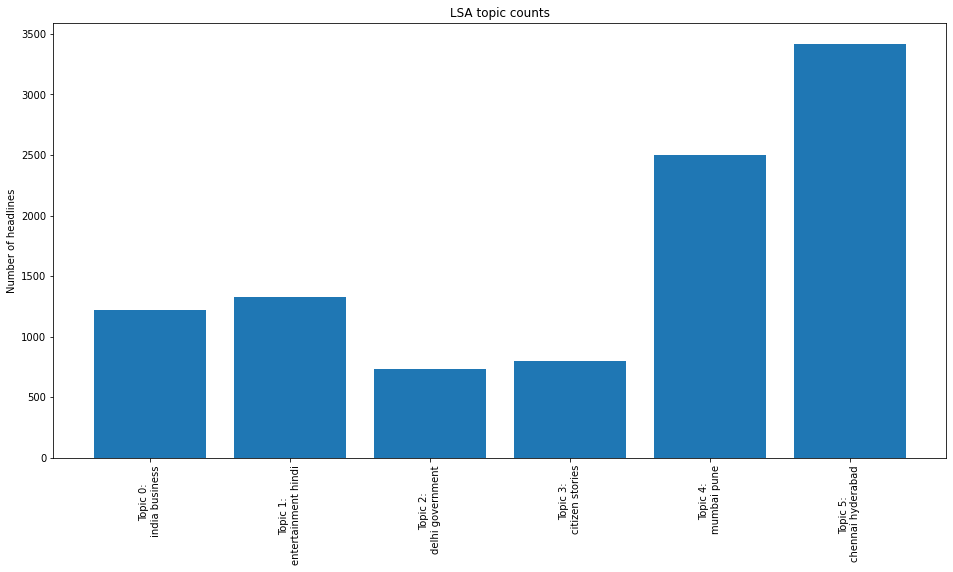

In [61]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [62]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.023s...
[t-SNE] Computed neighbors for 10000 samples in 0.912s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.007461
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.617935
[t-SNE] KL divergence after 2000 iterations: 0.802433


In [63]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [64]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [65]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [66]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [67]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [68]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india business delhi chennai goa chandigarh rs court noida mumbai
Topic 2:  citizen stories life style patna jaipur bengaluru road delhi new
Topic 3:  ahmedabad hyderabad man year chennai held delhi old woman tamil
Topic 4:  mumbai india hyderabad rs maharashtra home nashik bjp cm crore
Topic 5:  entertainment hindi news bollywood movies tv events kannada kapoor tamil
Topic 6:  kolkata pune sports world india cricket kochi lucknow bengaluru cup


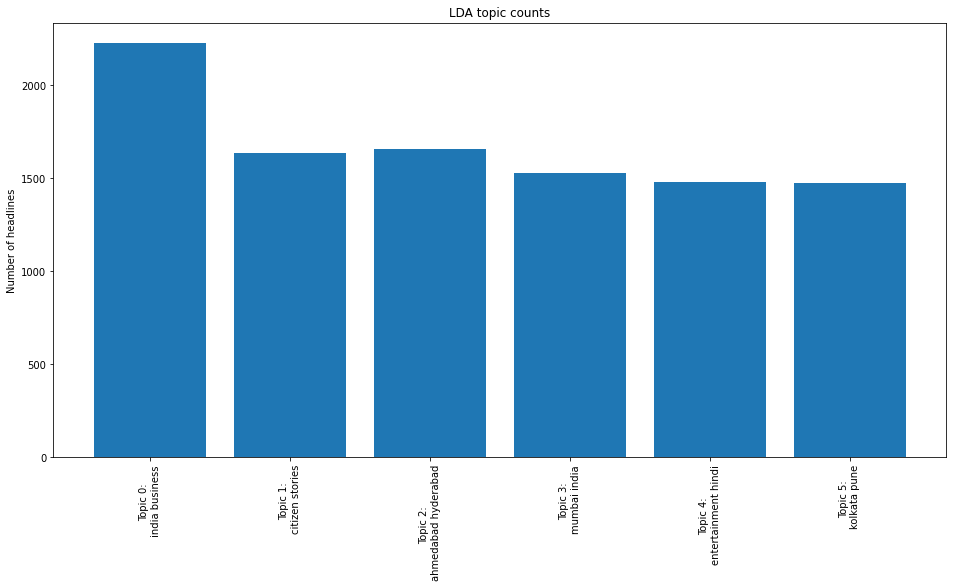

In [69]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [70]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.013s...
[t-SNE] Computed neighbors for 10000 samples in 0.654s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.001132
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.273201
[t-SNE] KL divergence after 2000 iterations: 1.108961


In [71]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 8**

In [72]:
num_topics=8

In [73]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [74]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [75]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [76]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0     -108.958252 -208.941483       1        1  15.152343
1      186.487061  -98.103249       2        1  14.004065
6       19.245832  160.858780       3        1  13.121421
7      170.658829   75.445076       4        1  12.761199
2       -1.386411  -35.043739       5        1  11.742126
4     -145.800095  106.944611       6        1  11.504047
3       64.834541 -221.825272       7        1  11.314642
5     -196.906036  -58.990913       8        1  10.400156, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  7513.000000  7513.000000  Default  30.0000  30.0000
4599   entertainment  6936.000000  6936.000000  Default  29.0000  29.0000
2113        business  3775.000000  3775.000000  Default  28.0000  28.0000
6271           hindi  3914.000000  3914.000000  Default  27.0000  27.0000
3684           delhi  5034.000000  5034.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
3205          couple   201.099443   201.942286   Topic8  -5.5721   2.2592
12121              s   770.219219  7536.975345   Topic8  -4.2292  -0.0176
6335            home   363.602775  1185.280403   Topic8  -4.9798   1.0817
8394             man   329.542519  1220.373454   Topic8  -5.0782   0.9541
2299           cases   214.517588   353.800975   Topic8  -5.5075   1.7630

[317 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
252        7  0.995515        act
255        5  0.998505     action
417        8  0.999124       agra
431        4  0.998327      ahead
436        6  0.999576  ahmedabad
...      ...       ...        ...
15609      4  0.999495      world
15625      6  0.995633      worth
15685      2  0.999488       year
15687      4  0.998247      years
15711      5  0.996233      youth

[305 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 7, 8, 3, 5, 4, 6])

In [77]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['chennai', 'police', 'khan', 'thiruvananthapuram', 'tamil', 'news', 's', 'bollywood', 'hindi', 'entertainment']


Top 10 words for topic #1:
['old', 'court', 'students', 'year', 'events', 's', 'movies', 'mumbai', 'hyderabad', 'delhi']


Top 10 words for topic #2:
['minister', 'chief', 'hc', 'kochi', 'nagpur', 's', 'india', 'lucknow', 'patna', 'goa']


Top 10 words for topic #3:
['cops', 'rajasthan', 'set', 'visakhapatnam', 'water', 'road', 'jaipur', 'bengaluru', 'citizen', 'stories']


Top 10 words for topic #4:
['gujarat', 'lakh', 'bhopal', 'crore', 's', 'held', 'rs', 'ahmedabad', 'business', 'india']


Top 10 words for topic #5:
['surat', 'trichy', 'body', 'help', 'health', 's', 'style', 'chandigarh', 'life', 'pune']


Top 10 words for topic #6:
['t', 'maharashtra', 'mumbai', 'today', 'cm', 'day', 'government', 'delhi', 'tv', 'kolkata']


Top 10 words for topic #7:
['cricket', 'says', 'gets', 'kannada', 'new', 'news', 'world', 'entertainment', 'sports', 'chennai']




In [78]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [79]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,3
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,0
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,1
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,2
62960,going to india gate tonight? you could be in f...,Positive,6
62961,; cops to ensure safe new year celebrations in...,Positive,1
62962,ten more private trains from mumbai on cards m...,Positive,2


In [80]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [81]:
df_topic.Topic = df_topic.Topic.astype(str)


In [82]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [83]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_8.csv', index = False, encoding='utf-8')

# **LSA**

In [84]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [85]:
reindexed_data=df_news.text
n_topics=num_topics

In [86]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [87]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [88]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [89]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [90]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [91]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [92]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business sports says modi pm cricket world day rs
Topic 2:  entertainment hindi bollywood news movies events tv kapoor lucknow kannada
Topic 3:  delhi government court high noida air man gurgaon metro new
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai ahmedabad rs held jaipur year man maharashtra old gujarat
Topic 6:  goa life style news sports world new tv home jaipur
Topic 7:  hyderabad kolkata bengaluru lucknow jaipur kochi chandigarh man nagpur woman
Topic 8:  chennai pune chandigarh patna tamil nadu water bihar rs rain


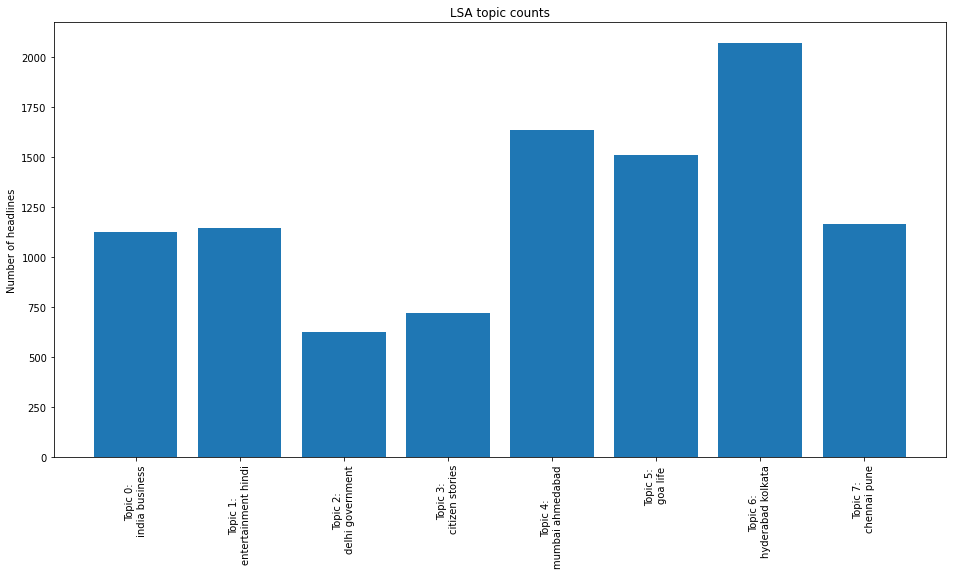

In [93]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [94]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.024s...
[t-SNE] Computed neighbors for 10000 samples in 1.314s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.009477
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.502426
[t-SNE] KL divergence after 2000 iterations: 0.728149


In [95]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [96]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [97]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [98]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [99]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [100]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india business kolkata pune chennai noida rs court modi high
Topic 2:  citizen stories patna road life style health home garbage water
Topic 3:  hyderabad entertainment news chennai tamil movies year man held old
Topic 4:  mumbai bengaluru india bjp rs maharashtra congress nashik hyderabad bhopal
Topic 5:  entertainment hindi bollywood style life jaipur kapoor khan news music
Topic 6:  news chandigarh lucknow entertainment tv kannada movies hindi gurgaon update
Topic 7:  goa india sports nagpur rs lakh cricket ahmedabad home kochi
Topic 8:  delhi ahmedabad mumbai world sports kochi cup india day dehradun


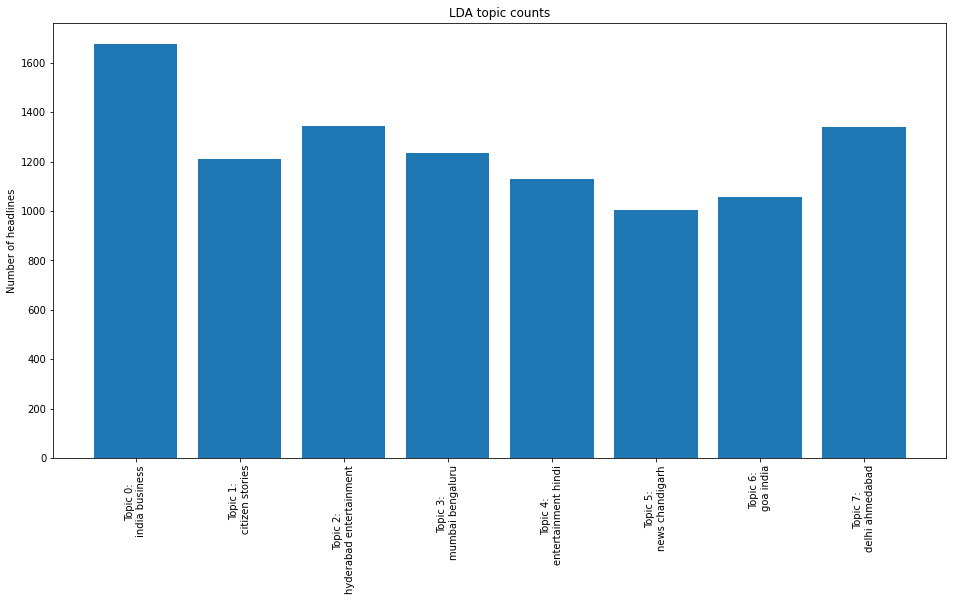

In [101]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [102]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.010s...
[t-SNE] Computed neighbors for 10000 samples in 1.075s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.000226
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.472168
[t-SNE] KL divergence after 2000 iterations: 1.516271


In [103]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 10**

In [104]:
num_topics=10

In [105]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [106]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [107]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [108]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
2      32.420952   8.115230       1        1  13.147906
0       0.648955  71.707100       2        1  11.163003
5      71.019684   9.971006       3        1  10.720805
1       3.785981  33.185135       4        1  10.559562
9     -42.666500  -9.222070       5        1   9.716375
7      -3.621689 -43.526516       6        1   9.403790
3      -3.632402  -4.171708       7        1   9.242363
6     -36.584400  35.804413       8        1   9.127969
4      44.391380  50.615383       9        1   8.470807
8      40.235809 -31.591665      10        1   8.447420, topic_info=                Term         Freq        Total Category  logprob  loglift
3684           delhi  5138.000000  5138.000000  Default  30.0000  30.0000
6689           india  6918.000000  6918.000000  Default  29.0000  29.0000
4599   entertainment  6967.000000  6967.000000  Default  28.0000  28.0000
9138          mumbai  3647.000000  3647.000000  Default  27.0000  27.0000
6498       hyderabad  3525.000000  3525.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
3576        december   210.162668   211.028404  Topic10  -5.3200   2.4672
12121              s   834.633614  7461.800694  Topic10  -3.9409   0.2807
7635           kochi   294.809734  1320.568514  Topic10  -4.9816   0.9718
2299           cases   223.594508   362.988483  Topic10  -5.2581   1.9868
14413          today   224.884311   942.142406  Topic10  -5.2523   1.0387

[378 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
225        2  0.997288  accused
252        8  0.997381      act
255       10  0.997909   action
263        9  0.997228    actor
387        6  0.995790   africa
...      ...       ...      ...
15598      6  0.999379     work
15609      6  0.999324    world
15625      7  0.995980    worth
15685     10  0.999547     year
15687      3  0.998585    years

[366 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 6, 2, 10, 8, 4, 7, 5, 9])

In [109]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['hc', 'case', 'khan', 'thiruvananthapuram', 'bjp', 'hindi', 'nagpur', 'tv', 'ahmedabad', 'news']


Top 10 words for topic #1:
['nadu', 'woman', 'tamil', 'man', 'vijayawada', 'high', 'court', 's', 'hyderabad', 'delhi']


Top 10 words for topic #2:
['singh', 'madurai', 'kapoor', 'events', 's', 'hindi', 'bollywood', 'business', 'india', 'entertainment']


Top 10 words for topic #3:
['chandigarh', 'cops', 'gujarat', 'set', 'lakh', 'visakhapatnam', 'crore', 'day', 'rs', 'bengaluru']


Top 10 words for topic #4:
['house', 'traffic', 't', 'minister', 'soon', 'chief', 'meet', 'bhopal', 's', 'kolkata']


Top 10 words for topic #5:
['years', 'home', 'gets', 'kochi', 's', 'chandigarh', 'style', 'patna', 'life', 'goa']


Top 10 words for topic #6:
['people', 'indian', 'centre', 'today', 'maharashtra', 'new', 'cm', 'government', 'india', 'mumbai']


Top 10 words for topic #7:
['open', 'cup', 'nashik', 'work', 'cricket', 'says', 'world', 'sports', 'pune', 'chennai']


Top 10 words for topic #8:
['g

In [110]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [111]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,6
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,2
3,harassment in office dm seeks action taken re...,Negative,8
4,two students end their lives mumbai,Negative,6
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,0
62960,going to india gate tonight? you could be in f...,Positive,5
62961,; cops to ensure safe new year celebrations in...,Positive,6
62962,ten more private trains from mumbai on cards m...,Positive,6


In [112]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [113]:
df_topic.Topic = df_topic.Topic.astype(str)


In [114]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [115]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_10.csv', index = False, encoding='utf-8')

# **LSA**

In [116]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [117]:
reindexed_data=df_news.text
n_topics=num_topics

In [118]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [119]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [120]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [121]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [122]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [123]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [124]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new day today bjp
Topic 2:  entertainment hindi bollywood news movies tv events kapoor kannada music
Topic 3:  delhi government court high air noida metro man new patna
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai rs held maharashtra jaipur lakh crore year nashik man
Topic 6:  life style news new kochi tv jaipur day health gadgets
Topic 7:  hyderabad bengaluru ahmedabad lucknow chandigarh patna jaipur man nagpur woman
Topic 8:  chennai goa tamil nadu water madras rain rs court coimbatore
Topic 9:  sports world cup cricket says icc india west pakistan kolkata
Topic 10:  pune kolkata chandigarh ahmedabad goa year maharashtra home rs old


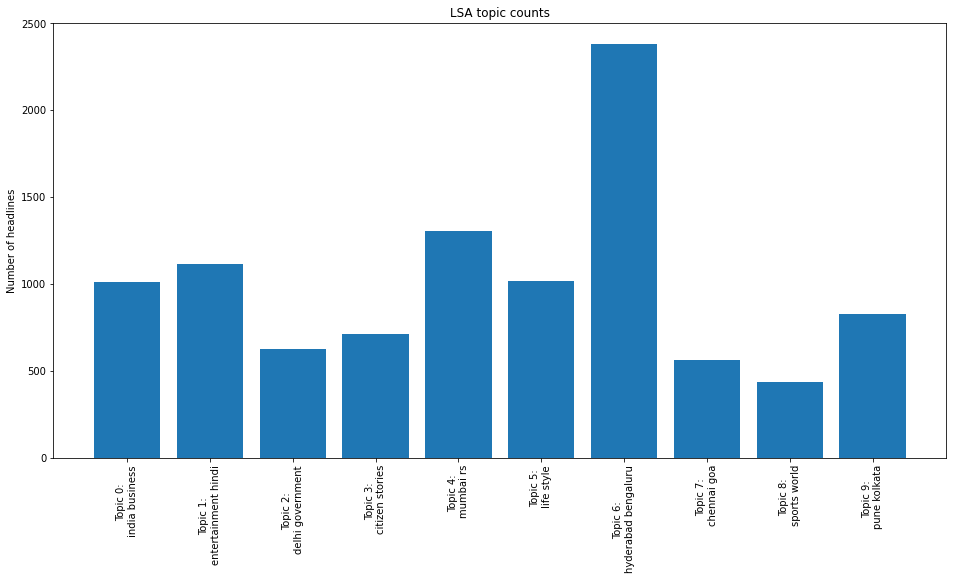

In [125]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [126]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.031s...
[t-SNE] Computed neighbors for 10000 samples in 1.586s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.010731
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.735512
[t-SNE] KL divergence after 2000 iterations: 0.739524


In [127]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [128]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [129]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [130]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [131]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [132]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  business india delhi chennai nagpur modi rs pm hc mumbai
Topic 2:  style life pune nashik sports spotlight health bengaluru news kannada
Topic 3:  news india entertainment movies tamil sports chennai cricket world nadu
Topic 4:  news tv india mumbai bjp maharashtra visakhapatnam hindi says boss
Topic 5:  entertainment hindi bollywood kapoor news music events singh khan tv
Topic 6:  kolkata patna jaipur rs rajasthan lakh bihar aurangabad body civic
Topic 7:  hyderabad goa entertainment events hindi bollywood telangana india mysuru says
Topic 8:  mumbai bengaluru kochi man held noida dehradun delhi day bhopal
Topic 9:  citizen stories chandigarh pune road hyderabad year rs delhi bengaluru
Topic 10:  ahmedabad lucknow gujarat home surat education rain india man bhubaneswar


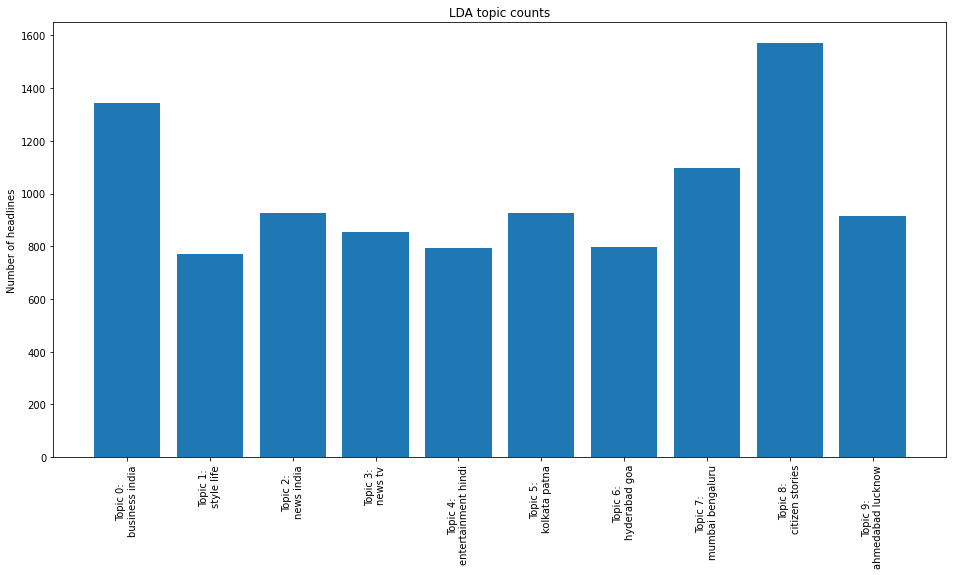

In [133]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [134]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.014s...
[t-SNE] Computed neighbors for 10000 samples in 1.655s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.000082
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.370132
[t-SNE] KL divergence after 2000 iterations: 1.672446


In [135]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 12**

In [136]:
num_topics=12

In [137]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [138]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [139]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [140]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
10       5.310529  171.049652       1        1  10.695602
2      136.304657   23.800941       2        1   9.721422
4      101.190552  -84.985191       3        1   9.429902
5     -106.824867  148.841736       4        1   8.923018
7      -44.365761   78.632721       5        1   8.515123
9       43.884090   73.474022       6        1   8.214509
11     114.093971  135.933029       7        1   8.015681
1     -119.727142  -72.077179       8        1   7.602981
8      -49.518208   -9.617325       9        1   7.389977
0     -141.938736   40.055210      10        1   7.302177
3       38.731544  -14.776019      11        1   7.107731
6      -10.944340 -107.193344      12        1   7.081877, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  7190.000000  7190.000000  Default  30.0000  30.0000
4599   entertainment  6806.000000  6806.000000  Default  29.0000  29.0000
3684           delhi  4860.000000  4860.000000  Default  28.0000  28.0000
6498       hyderabad  3473.000000  3473.000000  Default  27.0000  27.0000
13606        stories  3233.000000  3233.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
13637         street   153.568182   154.451106  Topic12  -5.4574   2.6419
14063          tamil   816.688179  1467.673322  Topic12  -3.7863   2.0615
11950          roads   230.158464   297.204024  Topic12  -5.0528   2.3920
2552         chennai   898.335712  3039.164668  Topic12  -3.6910   1.4288
3526             day   210.293092  1293.107987  Topic12  -5.1431   0.8313

[439 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
205        3  0.994464  accident
225       10  0.996984   accused
252        4  0.994856       act
255        4  0.997413    action
263       11  0.995327     actor
...      ...       ...       ...
15609      5  0.943532     world
15625      7  0.996693     worth
15685      1  0.999391      year
15687     11  0.998862     years
15711      4  0.997859     youth

[426 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 3, 5, 6, 8, 10, 12, 2, 9, 1, 4, 7])

In [141]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:
['kolhapur', 'trichy', 'school', 'women', 's', 'visakhapatnam', 'police', 'new', 'chandigarh', 'pune']


Top 10 words for topic #1:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['kids', 'telangana', 's', 'gujarat', 'high', 'thiruvananthapuram', 'court', 'events', 'ahmedabad', 'hyderabad']


Top 10 words for topic #2:
['aurangabad', 'telugu', 'karnataka', 'centre', 'set', 's', 'tv', 'news', 'bengaluru', 'delhi']


Top 10 words for topic #3:
['cases', 'haryana', 'traffic', 'gurgaon', 'mumbai', 'bhopal', 'years', 'cops', 'gets', 'lucknow']


Top 10 words for topic #4:
['mangaluru', 'west', 'minister', 'soon', 'meet', 't', 'day', 's', 'business', 'india']


Top 10 words for topic #5:
['body', 'bihar', 'health', 'vijayawada', 'cm', 's', 'style', 'patna', 'life', 'goa']


Top 10 words for topic #6:
['best', 'love', 'open', 'nadu', 'tamil', 'music', 'chennai', 'road', 'citizen', 'stories']


Top 10 words for topic #7:
['coimbatore', 'madurai', 'congress', 'cricket', 'khan', 'water', 'world', 'chennai', 'jaipur', 'sports']


Top 10 words for topic #8:
['state', 'make', 'govt', 'kerala', 'pm', 'education', 'modi', 'noida', 'dehradun', 'home']


Top 10 words for topic 

In [142]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [143]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,5
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,10
3,harassment in office dm seeks action taken re...,Negative,5
4,two students end their lives mumbai,Negative,11
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,11
62960,going to india gate tonight? you could be in f...,Positive,2
62961,; cops to ensure safe new year celebrations in...,Positive,11
62962,ten more private trains from mumbai on cards m...,Positive,11


In [144]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_12.csv', index = False, encoding='utf-8')

In [145]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [146]:
df_topic.Topic = df_topic.Topic.astype(str)


In [147]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [148]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_12_of_16.csv', index = False, encoding='utf-8')

# **LSA**

In [149]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [150]:
reindexed_data=df_news.text
n_topics=num_topics

In [151]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [152]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [153]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [154]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [155]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [156]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [157]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp sc today
Topic 2:  entertainment hindi bollywood news movies tv events kapoor kannada music
Topic 3:  delhi government court high air noida man new metro aap
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai rs held maharashtra nashik crore lakh case man bjp
Topic 6:  news tv gadgets tamil new kannada telugu update boss nadu
Topic 7:  hyderabad telangana police events entertainment woman arrested govt man bjp
Topic 8:  chennai tamil nadu madras water rain court hc high rs
Topic 9:  sports world cup cricket icc india says pakistan vs south
Topic 10:  pune kochi maharashtra rs year noida man kerala water woman
Topic 11:  kolkata bengal west cops new puja year lake metro death
Topic 12:  chandigarh ahmedabad bengaluru goa jaipur patna lucknow life style nagpur


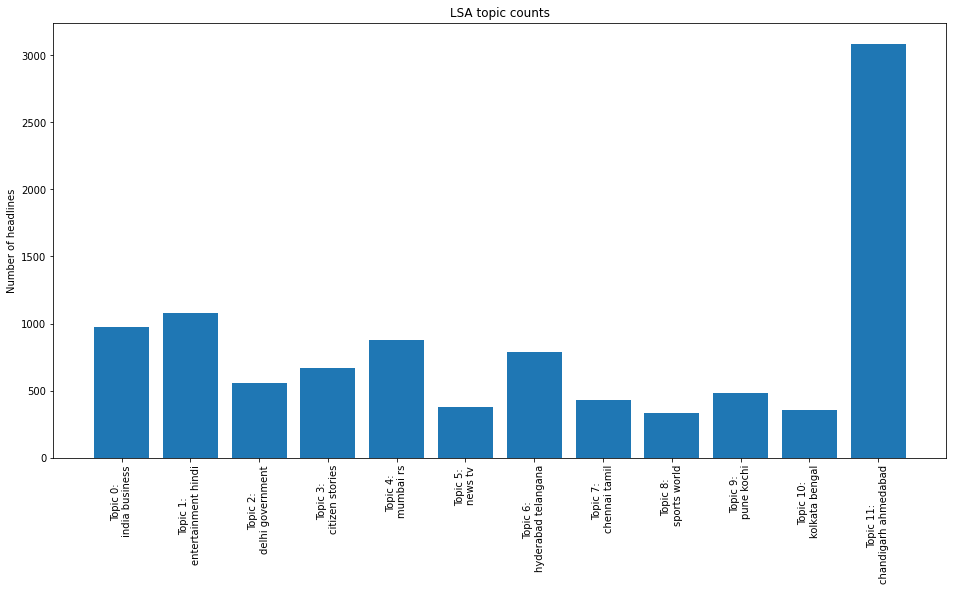

In [158]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [159]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.024s...
[t-SNE] Computed neighbors for 10000 samples in 0.963s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.013031
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.721901
[t-SNE] KL divergence after 2000 iterations: 0.668695


In [160]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [161]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [162]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [163]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [164]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [165]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  business india pune rs court high goa hyderabad chennai mumbai
Topic 2:  jaipur patna kochi life style rajasthan lucknow health aurangabad university
Topic 3:  ahmedabad year old held gujarat man woman news gadgets coimbatore
Topic 4:  india maharashtra bjp modi mumbai nashik pm cm pune surat
Topic 5:  entertainment hindi bollywood kapoor khan hyderabad singh news shares india
Topic 6:  news entertainment movies kolkata sports india kannada tv world cricket
Topic 7:  goa entertainment events home education music hyderabad gurgaon says india
Topic 8:  delhi mumbai noida bhopal held meerut india metro bareilly cops
Topic 9:  chennai hyderabad chandigarh style life tamil nadu rain bengaluru india
Topic 10:  citizen stories rs road nagpur crore lakh garbage thiruvananthapuram mumbai
Topic 11:  bengaluru india new karnataka mysuru hyderabad gets ghaziabad entertainment says
Topic 12:  lucknow dehradun vijayawada patna pradesh water chennai man vadodara trichy


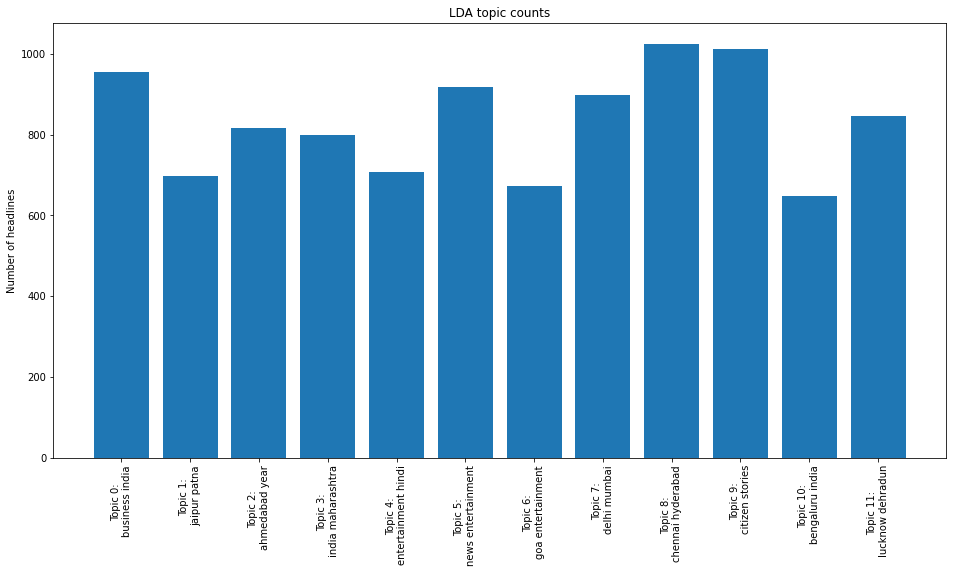

In [166]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [167]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.030s...
[t-SNE] Computed neighbors for 10000 samples in 3.411s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.097614
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.391022
[t-SNE] KL divergence after 2000 iterations: 1.769239


In [168]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 14**

In [169]:
num_topics=14

In [170]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [171]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [172]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [173]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0        1.425140 -203.131439       1        1  12.074575
2       93.696953  -55.018154       2        1   7.683062
6      141.694016   25.320429       3        1   7.414350
5     -126.233505    5.739788       4        1   7.174182
13     -59.868134  101.519302       5        1   7.019178
1      151.966629  133.119141       6        1   6.977909
3       12.542690 -101.441658       7        1   6.943293
10      49.372585   57.773476       8        1   6.885292
9      203.505997  -84.541840       9        1   6.509647
7      119.923477 -166.068970      10        1   6.494444
8      -19.315592   -8.882428      11        1   6.454645
4      -95.841057 -109.373474      12        1   6.403340
12      37.554749  165.057098      13        1   6.388472
11     243.648911   32.733547      14        1   5.577614, topic_info=                Term         Freq        Total Category  logprob  loglift
4599   entertainment  6465.000000  6465.000000  Default  30.0000  30.0000
3684           delhi  5117.000000  5117.000000  Default  29.0000  29.0000
6689           india  7338.000000  7338.000000  Default  28.0000  28.0000
9138          mumbai  3736.000000  3736.000000  Default  27.0000  27.0000
2113        business  3642.000000  3642.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
1077            auto   179.782871   180.681887  Topic14  -5.0611   2.8814
14353          tiger   178.460598   179.359614  Topic14  -5.0684   2.8814
6181           heavy   175.764536   176.663552  Topic14  -5.0837   2.8813
7486             key   165.233574   166.132591  Topic14  -5.1454   2.8810
7895         leaders   161.657561   162.556577  Topic14  -5.1673   2.8809

[499 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
225        1  0.994445  accused
252        3  0.995568      act
255       11  0.997861   action
263       10  0.995660    actor
387        5  0.996062   africa
...      ...       ...      ...
15625      9  0.997049    worth
15650      6  0.996592  written
15685      5  0.999520     year
15687     10  0.998863    years
15711      2  0.996426    youth

[484 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 7, 6, 14, 2, 4, 11, 10, 8, 9, 5, 13, 12])

In [174]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['khan', 'kannada', 'tamil', 'tv', 'events', 's', 'bollywood', 'news', 'hindi', 'entertainment']


Top 10 words for topic #1:
['telugu', 'telangana', 'centre', 'rain', 'vijayawada', 'high', 'thiruvananthapuram', 'court', 'ahmedabad', 'hyderabad']


Top 10 words for topic #2:
['agra', 'trichy', 'bihar', 'aurangabad', 'west', 's', 'patna', 'goa', 'business', 'india']


Top 10 words for topic #3:
['metro', 'mysuru', 'city', 'open', 'water', 'visakhapatnam', 'road', 'bengaluru', 'citizen', 'stories']


Top 10 words for topic #4:
['airport', 'spotlight', 'traffic', 'time', 'soon', 'madurai', 'crore', 'bhopal', 'rs', 'mumbai']


Top 10 words for topic #5:
['surat', 'body', 's', 'health', 'school', 'women', 'home', 'style', 'chandigarh', 'life']


Top 10 words for topic #6:
['lakh', 'new', 's', 'cops', 'meet', 'maharashtra', 'cm', 'government', 'kolkata', 'delhi']


Top 10 words for topic #7:
['education', 'held', 'years', 'music', 'woman', 'kolkata', 'man', 'gets', 'new', 'pune']


Top 10 wo

In [175]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [176]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,6
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,0
3,harassment in office dm seeks action taken re...,Negative,8
4,two students end their lives mumbai,Negative,8
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,13
62960,going to india gate tonight? you could be in f...,Positive,3
62961,; cops to ensure safe new year celebrations in...,Positive,7
62962,ten more private trains from mumbai on cards m...,Positive,4


In [177]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_14.csv', index = False, encoding='utf-8')

In [178]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [179]:
df_topic.Topic = df_topic.Topic.astype(str)


In [180]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [181]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_14.csv', index = False, encoding='utf-8')

# **LSA**

In [182]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [183]:
reindexed_data=df_news.text
n_topics=num_topics

In [184]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [185]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [186]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [187]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [188]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [189]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [190]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp sc today
Topic 2:  entertainment hindi bollywood news movies tv events kapoor kannada music
Topic 3:  delhi government court high air noida metro new man aap
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai held maharashtra rs case nashik man bjp hc thane
Topic 6:  news tv gadgets tamil kannada telugu update boss bigg cricket
Topic 7:  hyderabad telangana police woman events kochi entertainment arrested govt bjp
Topic 8:  chennai tamil nadu madras water rain court hc high rs
Topic 9:  sports india says cricket world cup indies icc vs modi
Topic 10:  pune maharashtra kochi rs year man rain woman water flood
Topic 11:  kolkata bengal west cops kochi puja new lake metro year
Topic 12:  chandigarh ahmedabad bengaluru goa jaipur patna lucknow rs nagpur man
Topic 13:  life style spotlight fashion health fitness news food weight celeb
Topic 14:  world cup icc sports cricket new pakistan zealand sa

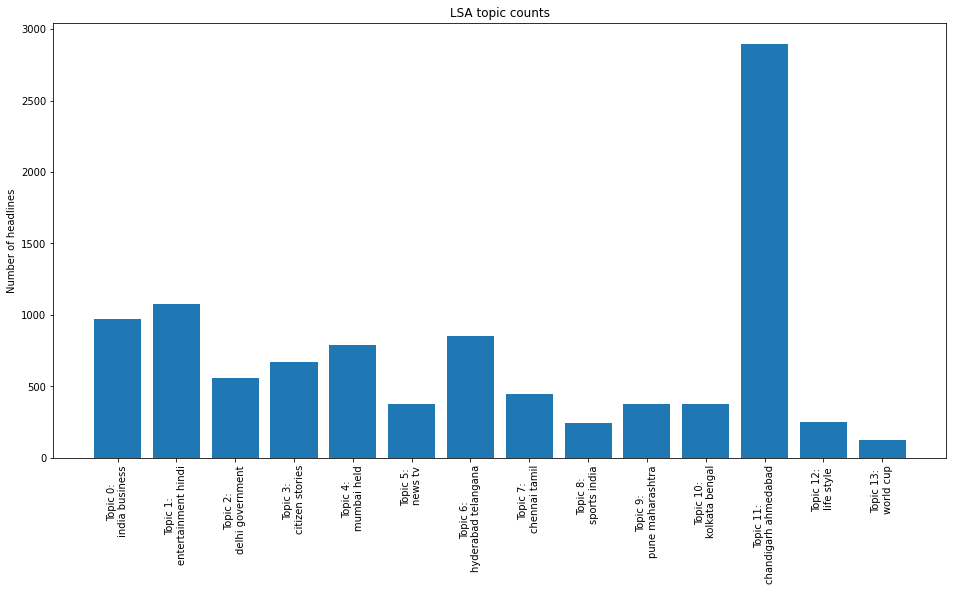

In [191]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [192]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.025s...
[t-SNE] Computed neighbors for 10000 samples in 3.180s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.014040
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.299843
[t-SNE] KL divergence after 2000 iterations: 0.631704


In [193]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [194]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [195]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [196]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [197]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [198]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  business india pune rs lakh hc mumbai ghaziabad students govt
Topic 2:  style patna life nashik pradesh day bihar health fashion fitness
Topic 3:  news chandigarh entertainment movies year old man held tamil woman
Topic 4:  mumbai chennai maharashtra bjp india surat assembly cm kozhikode elections
Topic 5:  entertainment hindi bollywood kapoor khan music news photos shares picture
Topic 6:  news tv lucknow hindi kannada nagpur entertainment visakhapatnam boss bigg
Topic 7:  goa hyderabad india cm telangana delhi says entertainment singh seeks
Topic 8:  delhi kochi water india metro bareilly today gets meerut entertainment
Topic 9:  world cup home icc india sports cricket pakistan hyderabad mumbai
Topic 10:  citizen stories hyderabad road rs crore bhubaneswar garbage delhi footpath
Topic 11:  jaipur chennai tamil nadu noida mangaluru mysuru karnataka cops delhi
Topic 12:  kolkata sports india cricket jaipur west news trichy rajasthan indies
Topic 13:  bengaluru entertainment e

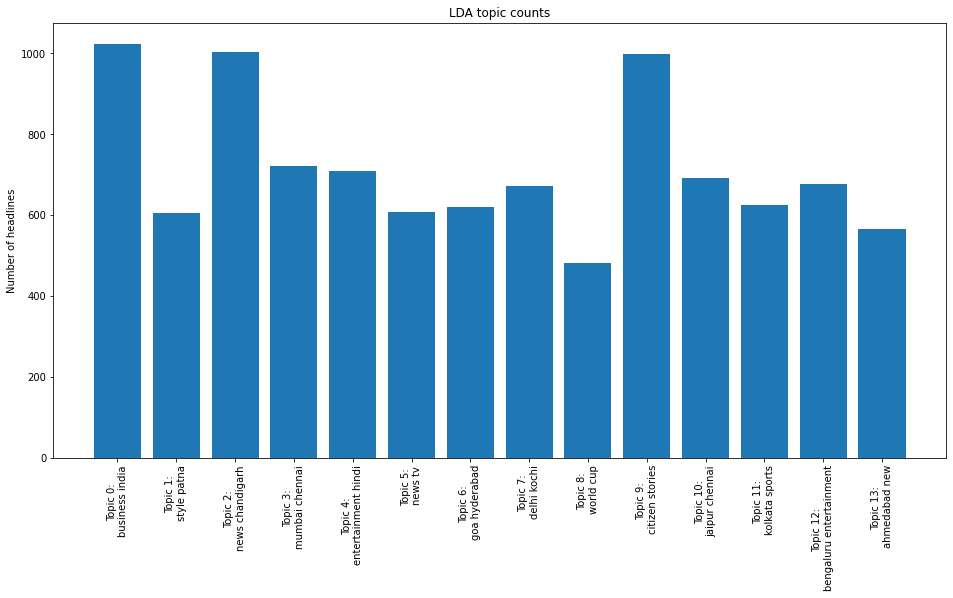

In [199]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [200]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.025s...
[t-SNE] Computed neighbors for 10000 samples in 2.738s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.100013
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.903549
[t-SNE] KL divergence after 2000 iterations: 1.832451


In [201]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 16**






In [203]:
num_topics=16

In [204]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [205]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [206]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [207]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
6     -225.349854  113.708771       1        1  8.108888
12     -11.214129  210.724503       2        1  7.645749
7     -370.246948  298.926941       3        1  7.641689
4     -115.863266  418.656219       4        1  7.559570
14     -38.937935  -11.941959       5        1  7.043470
13    -468.892181   27.747469       6        1  6.215285
1      394.578949  -27.335003       7        1  6.045347
11     195.150314  102.077026       8        1  5.838597
0     -445.241516 -257.978210       9        1  5.820561
10     -54.327461 -242.647034      10        1  5.781726
3     -219.093063 -421.854706      11        1  5.686057
8      147.051407 -128.542709      12        1  5.538094
9     -249.556183 -122.286224      13        1  5.422898
5      295.431061 -302.292206      14        1  5.396787
2      209.292816  347.965088      15        1  5.232896
15      68.881561 -446.165314      16        1  5.022385, topic_info=                Term         Freq        Total Category  logprob  loglift
3684           delhi  5035.000000  5035.000000  Default  30.0000  30.0000
6689           india  7097.000000  7097.000000  Default  29.0000  29.0000
4599   entertainment  6705.000000  6705.000000  Default  28.0000  28.0000
13606        stories  3250.000000  3250.000000  Default  27.0000  27.0000
2680         citizen  3231.000000  3231.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
13536       stations   129.962869   130.870471  Topic16  -5.2807   2.9843
1251             ban   128.907967   129.815570  Topic16  -5.2889   2.9842
1013          attack   124.074854   124.982456  Topic16  -5.3271   2.9840
14413          today   689.391509   942.797399  Topic16  -3.6121   2.6782
2784              cm   243.268460   975.278377  Topic16  -4.6538   1.6027

[560 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
205       12  0.994776  accident
225        9  0.995381   accused
252       11  0.996567       act
255        9  0.997623    action
263        3  0.994059     actor
...      ...       ...       ...
15650     10  0.996974   written
15685      6  0.999438      year
15687      3  0.998707     years
15702     12  0.996415      yogi
15711     15  0.995547     youth

[541 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 13, 8, 5, 15, 14, 2, 12, 1, 11, 4, 9, 10, 6, 3, 16])

In [208]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['state', 'chief', 'rain', 'singh', 'kapoor', 's', 'police', 'cops', 'thiruvananthapuram', 'bjp']


Top 10 words for topic #1:
['sc', 'green', 'kumar', 'air', 'centre', 's', 'university', 'students', 'ahmedabad', 'delhi']


Top 10 words for topic #2:
['ready', 'happy', 'news', 'corporation', 'college', 'free', 'gadgets', 's', 'gurgaon', 'goa']


Top 10 words for topic #3:
['indian', 'pradesh', 'govt', 'pm', 'modi', 'cm', 'vijayawada', 'city', 'bhopal', 'new']


Top 10 words for topic #4:
['love', 'mangaluru', 'time', 'make', 'madurai', 'congress', 'dehradun', 'bollywood', 'entertainment', 'hindi']


Top 10 words for topic #5:
['bus', 'cop', 'birthday', 'photos', 'civic', 'school', 'surat', 'body', 's', 'chandigarh']


Top 10 words for topic #6:
['win', 'shares', 'west', 'maharashtra', 'khan', 'day', 's', 'mumbai', 'business', 'india']


Top 10 words for topic #7:
['rajasthan', 'nashik', 'years', 'cricket', 'gets', 'world', 'india', 'jaipur', 'sports', 'pune']


Top 10 words for topic #

In [209]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [210]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,3
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,4
3,harassment in office dm seeks action taken re...,Negative,0
4,two students end their lives mumbai,Negative,11
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,8
62960,going to india gate tonight? you could be in f...,Positive,9
62961,; cops to ensure safe new year celebrations in...,Positive,6
62962,ten more private trains from mumbai on cards m...,Positive,6


In [211]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [212]:
df_topic.Topic = df_topic.Topic.astype(str)


In [213]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [214]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_16.csv', index = False, encoding='utf-8')

# **LSA**

In [215]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [216]:
reindexed_data=df_news.text
n_topics=num_topics

In [217]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [218]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [219]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [220]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [221]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [222]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [223]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp today day
Topic 2:  entertainment hindi bollywood news movies tv kapoor kannada music khan
Topic 3:  delhi government court air high man new metro noida aap
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai held maharashtra rs nashik bjp nagpur case man year
Topic 6:  news tv gadgets new kannada tamil telugu boss update bigg
Topic 7:  hyderabad telangana nagpur woman events entertainment police arrested govt bjp
Topic 8:  chennai tamil nadu madras water rain hc court high rs
Topic 9:  sports india says cricket world cup west icc vs modi
Topic 10:  pune maharashtra rs year man rain woman water new old
Topic 11:  kolkata bengal cops west puja new lake year death held
Topic 12:  chandigarh bengaluru jaipur patna kochi rs man home bhopal gurgaon
Topic 13:  life style spotlight health fashion fitness news food weight celeb
Topic 14:  world cup icc sports cricket pakistan says vs rest zealand
Topi

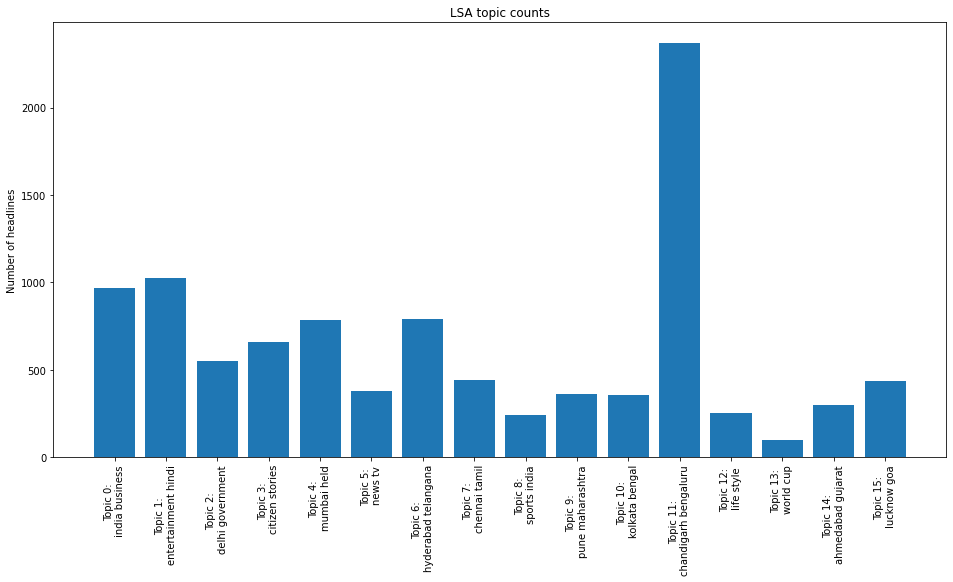

In [224]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [225]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 6.540s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.014734
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.020393
[t-SNE] KL divergence after 2000 iterations: 0.638738


In [226]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [227]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [228]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [229]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [230]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [231]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  business india nagpur rs pm modi students lakh ghaziabad bhubaneswar
Topic 2:  patna lucknow jaipur rajasthan bihar university india government delhi chandigarh
Topic 3:  news chandigarh entertainment movies tamil ahmedabad gadgets bengali gujarat punjab
Topic 4:  sports world cup cricket india icc pakistan cm south vs
Topic 5:  held entertainment meerut hindi bjp bollywood rajkot india hyderabad news
Topic 6:  tv news home dehradun court visakhapatnam education boss bigg hindi
Topic 7:  entertainment hindi bollywood kapoor khan news singh movies shares picture
Topic 8:  mumbai ahmedabad man maharashtra woman case bareilly body held civic
Topic 9:  hyderabad rs congress lakh mumbai surat india madurai bengaluru pune
Topic 10:  citizen stories road water bhopal rs crore garbage parking footpath
Topic 11:  india noida thiruvananthapuram sports cricket kerala mysuru karnataka minister hubballi
Topic 12:  style life vijayawada spotlight health fashion india mangaluru fitness news

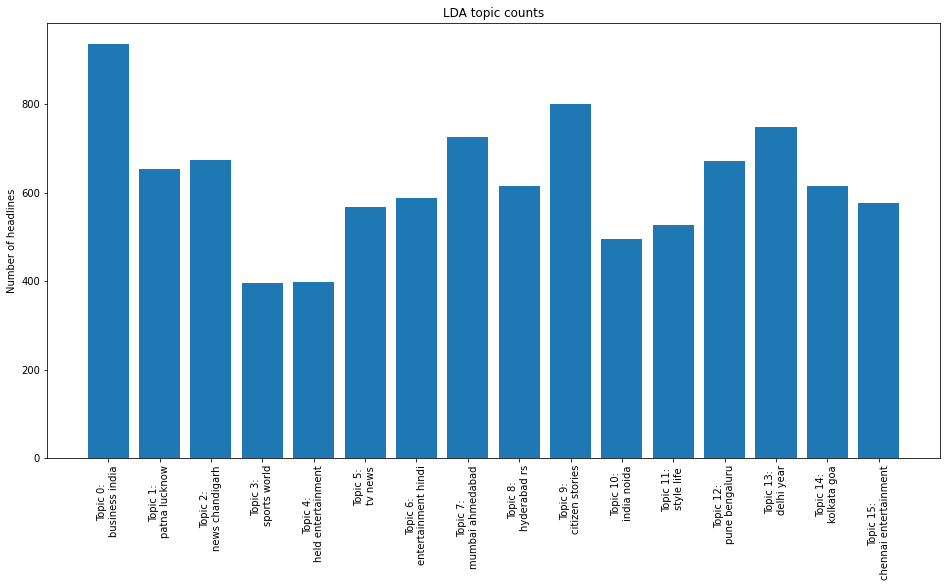

In [232]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [233]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.471s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.105637
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.034225
[t-SNE] KL divergence after 2000 iterations: 1.835392


In [234]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 18**

In [235]:
num_topics=18

In [236]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [237]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [238]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [239]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=               x          y  topics  cluster      Freq
topic                                                 
16     12.476386  21.314489       1        1  8.303975
12    -52.778774  53.617561       2        1  8.254932
9      18.721022  56.589184       3        1  7.096376
13     46.141033  27.913752       4        1  6.373695
1      22.451477  -7.324051       5        1  6.332673
14    -14.613425  34.742813       6        1  5.389351
6     -41.065746  20.553501       7        1  5.335701
10     32.631145 -47.710770       8        1  5.318619
5      -9.715158 -65.350708       9        1  5.313736
15      3.187571 -30.696495      10        1  5.226873
4     -77.629097 -17.928160      11        1  5.134647
2     -17.986679  68.631378      12        1  5.018649
17    -13.023953  -1.018700      13        1  4.886482
8      55.322254 -11.777896      14        1  4.688762
3     -45.792812  -9.629042      15        1  4.570801
0     -76.011116  20.829033      16        1  4.390219
7     -55.133263 -51.847134      17        1  4.326494
11    -27.017954 -33.631409      18        1  4.038015, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  6919.000000  6919.000000  Default  30.0000  30.0000
4599   entertainment  6574.000000  6574.000000  Default  29.0000  29.0000
3684           delhi  4689.000000  4689.000000  Default  28.0000  28.0000
6498       hyderabad  3512.000000  3512.000000  Default  27.0000  27.0000
13606        stories  3232.000000  3232.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
7207             job   159.081411   159.997555  Topic18  -4.8604   3.2037
5140            firm   157.478036   158.394180  Topic18  -4.8705   3.2036
10437          plant   152.720088   153.636232  Topic18  -4.9012   3.2034
13767        suicide   150.375494   151.291638  Topic18  -4.9167   3.2033
14132        teacher   134.588153   135.504296  Topic18  -5.0276   3.2026

[626 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
205       11  0.994424  accident
225        8  0.996087   accused
252       10  0.997788       act
255       12  0.996562    action
263       17  0.996653     actor
...      ...       ...       ...
15685      4  0.999467      year
15687     13  0.999015     years
15702     16  0.994628      yogi
15707     17  0.989486     young
15711      6  0.995433     youth

[620 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[17, 13, 10, 14, 2, 15, 7, 11, 6, 16, 5, 3, 18, 9, 4, 1, 8, 12])

In [240]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['airport', 'bareilly', 'kolhapur', 'traffic', 'south', 'make', 'singh', 'case', 'bjp', 'bhopal']


Top 10 words for topic #1:
['pradesh', 'telangana', 's', 'rain', 'cops', 'high', 'court', 'mumbai', 'pune', 'hyderabad']


Top 10 words for topic #2:
['varanasi', 'cases', 'mysuru', 'trichy', 'karnataka', 'university', 'held', 'students', 'lucknow', 'bengaluru']


Top 10 words for topic #3:
['shah', 'haryana', 'govt', 'state', 'time', 'soon', 'rs', 'madurai', 'gurgaon', 'crore']


Top 10 words for topic #4:
['rajkot', 'family', 'gadgets', 'hit', 'news', 's', 'police', 'meet', 't', 'kochi']


Top 10 words for topic #5:
['love', 'food', 'civic', 'spotlight', 'body', 's', 'health', 'style', 'chandigarh', 'life']


Top 10 words for topic #6:
['station', 'diwali', 'shares', 'centre', 'rajasthan', 'lakh', 'maharashtra', 'mumbai', 'rs', 'jaipur']


Top 10 words for topic #7:
['thane', 'big', 'power', 'wife', 'people', 'metro', 'nashik', 'man', 'says', 'ahmedabad']


Top 10 words for topic #8:
[

In [241]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [242]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,15
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,16
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,2
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,0
62960,going to india gate tonight? you could be in f...,Positive,10
62961,; cops to ensure safe new year celebrations in...,Positive,1
62962,ten more private trains from mumbai on cards m...,Positive,1


In [243]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [244]:
df_topic.Topic = df_topic.Topic.astype(str)


In [245]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [246]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_18.csv', index = False, encoding='utf-8')

# **LSA**

In [247]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [248]:
reindexed_data=df_news.text
n_topics=num_topics

In [249]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [250]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [251]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [252]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [253]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [254]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [255]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp today sc
Topic 2:  entertainment hindi bollywood news movies tv kapoor kannada music khan
Topic 3:  delhi government court high air noida metro man new aap
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai held maharashtra nashik rs case bjp man year thane
Topic 6:  news tv gadgets kannada tamil new telugu boss update bigg
Topic 7:  hyderabad telangana police woman entertainment events arrested bjp govt congress
Topic 8:  chennai tamil nadu madras water hc court rain high rs
Topic 9:  sports india cricket says world cup day icc west south
Topic 10:  pune maharashtra rs noida year man rain woman water old
Topic 11:  kolkata bengal cops west puja new lake year metro death
Topic 12:  chandigarh jaipur patna rs kochi nagpur home man gurgaon bhopal
Topic 13:  life style spotlight fashion health fitness news weight food celeb
Topic 14:  world cup icc sports cricket new pakistan vs says zealand
Top

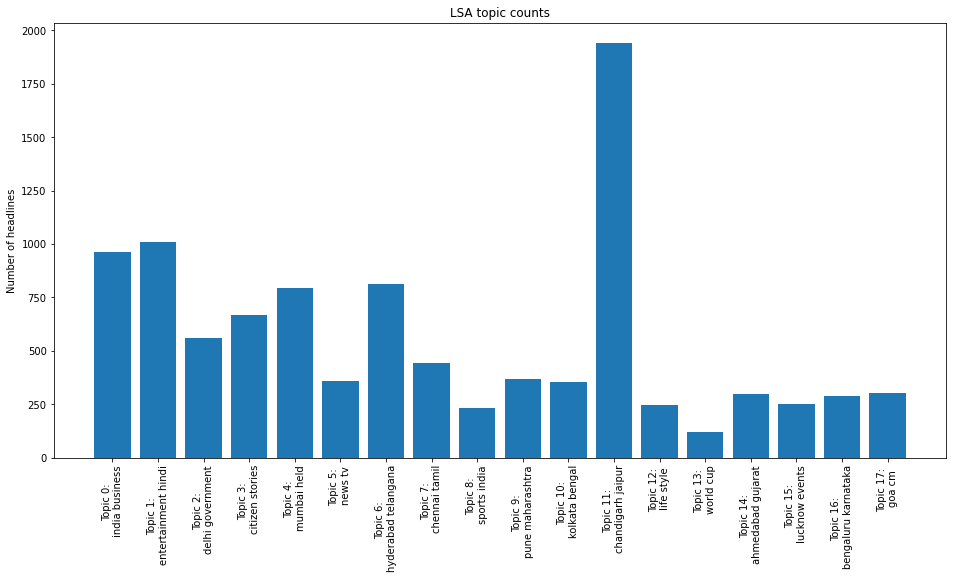

In [256]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [257]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 8.897s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.015574
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.132126
[t-SNE] KL divergence after 2000 iterations: 0.640756


In [258]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [259]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [260]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [261]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [262]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [263]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india business sports world cricket cup modi pm icc noida
Topic 2:  news tv kannada hindi entertainment mangaluru movies update ghaziabad written
Topic 3:  man year old held dehradun woman hyderabad arrested pune dies
Topic 4:  mumbai india rs maharashtra crore says bjp sena held kozhikode
Topic 5:  pradesh india chandigarh andhra minister vijayawada punjab madhya bhopal allahabad
Topic 6:  kolkata style life news visakhapatnam tv health boss bigg telugu
Topic 7:  goa nagpur cm ahmedabad hc bjp gujarat india chief state
Topic 8:  kochi india delhi metro kolkata business puja kerala hyderabad way
Topic 9:  lucknow pune rain delhi city university mumbai likely india heavy
Topic 10:  citizen stories hyderabad road india garbage parking footpath water bhubaneswar
Topic 11:  home news thiruvananthapuram gadgets education india meerut kerala surat hubballi
Topic 12:  vijayawada trichy india school kolhapur kolkata indore mumbai bengaluru traffic
Topic 13:  pune ahmedabad bengaluru 

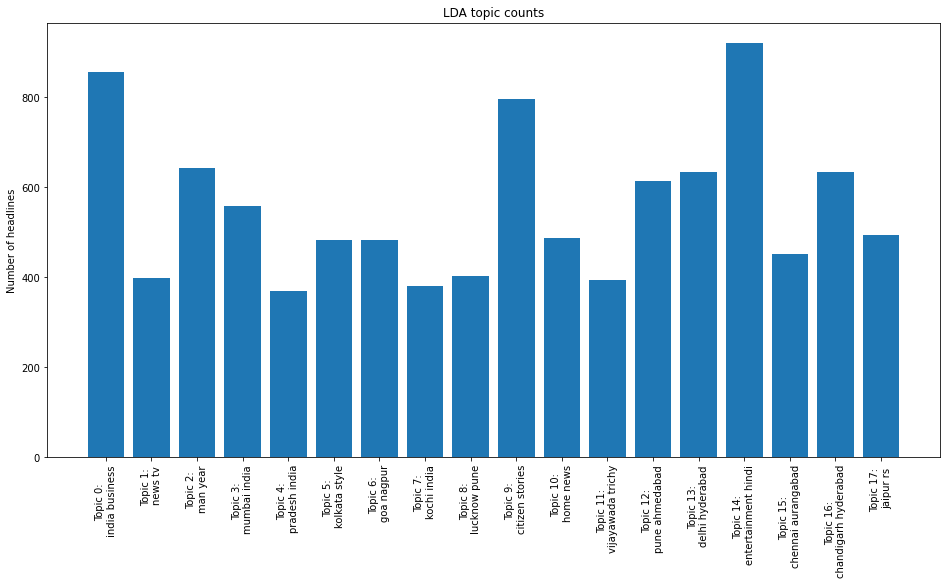

In [264]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [265]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.475s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.107281
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.961090
[t-SNE] KL divergence after 2000 iterations: 1.868687


In [266]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 20**

In [267]:
num_topics=20

In [268]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [269]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [270]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [271]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
16     -10.878068   10.538728       1        1  7.838151
7      -60.884026  -75.591820       2        1  7.202459
3       -2.336119  -53.289074       3        1  5.940960
12     -61.385319  -12.914634       4        1  5.752437
14     -28.737743  126.296997       5        1  5.504540
11       1.066606 -123.552811       6        1  5.168422
9       45.140720   -7.947869       7        1  5.104348
13    -140.795975  -98.530548       8        1  5.021265
2       61.531681  -83.240562       9        1  4.990949
6      -72.563057 -140.396881      10        1  4.890001
18      15.984491   63.578186      11        1  4.837662
5     -160.851624   68.945145      12        1  4.827619
1       85.961830   51.922935      13        1  4.680434
8      -99.020836  109.936348      14        1  4.645080
4     -176.764130   -8.681684      15        1  4.560898
0     -117.189880  -37.420200      16        1  4.396372
15     108.829918  -22.946203      17        1  3.930853
10      47.588097  121.934814      18        1  3.623234
17    -106.467834   30.176889      19        1  3.555310
19     -50.613804   59.328842      20        1  3.529009, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  7010.000000  7010.000000  Default  30.0000  30.0000
3684           delhi  4979.000000  4979.000000  Default  29.0000  29.0000
4599   entertainment  6538.000000  6538.000000  Default  28.0000  28.0000
6498       hyderabad  3606.000000  3606.000000  Default  27.0000  27.0000
9138          mumbai  3608.000000  3608.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
5129             fir   106.534551   107.453717  Topic20  -5.1266   3.3356
9429             net   106.386390   107.305555  Topic20  -5.1280   3.3356
15580          woman   614.698208   853.510082  Topic20  -3.3739   3.0159
12121              s   728.611324  7475.890723  Topic20  -3.2039   1.0159
9447            news   404.078582  3995.135307  Topic20  -3.7935   1.0529

[675 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
39        19  0.996239       2nd
205       14  0.995790  accident
225        5  0.996011   accused
252       10  0.996574       act
255       11  0.995890    action
...      ...       ...       ...
15650      9  0.993612   written
15685      9  0.999146      year
15687      3  0.998855     years
15702     19  0.994449      yogi
15711      8  0.996731     youth

[657 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[17, 8, 4, 13, 15, 12, 10, 14, 3, 7, 19, 6, 2, 9, 5, 1, 16, 11, 18, 20])

In [272]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['murder', 'birthday', 'kumar', 'surat', 'telangana', 'singh', 's', 'visakhapatnam', 'held', 'hyderabad']


Top 10 words for topic #1:
['times', 'plan', 's', 'days', 'vadodara', 'rain', 'gujarat', 'home', 'ahmedabad', 'pune']


Top 10 words for topic #2:
['meerut', 'death', 'girl', 'aurangabad', 'telugu', 's', 'old', 'news', 'year', 'tv']


Top 10 words for topic #3:
['project', 'haryana', 'rajasthan', 'gets', 'years', 'gurgaon', 'road', 'jaipur', 'citizen', 'stories']


Top 10 words for topic #4:
['english', 'traffic', 'bihar', 'soon', 'centre', 'school', 'congress', 't', 'bhopal', 'patna']


Top 10 words for topic #5:
['bus', 'cop', 'takes', 'man', 'schools', 'civic', 'body', 'make', 'chandigarh', 'chennai']


Top 10 words for topic #6:
['free', 'win', 'punjab', 'shares', 'indian', 's', 'maharashtra', 'thiruvananthapuram', 'new', 'mumbai']


Top 10 words for topic #7:
['work', 'south', 'time', 'cup', 'madurai', 'cricket', 'world', 'sports', 'business', 'india']


Top 10 words for top

In [273]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [274]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,6
1,bhujbal says higher power rate driving industr...,Negative,13
2,mandira bedi shares a monochrome picture in a ...,Negative,16
3,harassment in office dm seeks action taken re...,Negative,18
4,two students end their lives mumbai,Negative,14
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,5
62960,going to india gate tonight? you could be in f...,Positive,9
62961,; cops to ensure safe new year celebrations in...,Positive,6
62962,ten more private trains from mumbai on cards m...,Positive,6


In [275]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [276]:
df_topic.Topic = df_topic.Topic.astype(str)


In [277]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [278]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_20.csv', index = False, encoding='utf-8')

# **LSA**

In [279]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [280]:
reindexed_data=df_news.text
n_topics=num_topics

In [281]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [282]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [283]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [284]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [285]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [286]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [287]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp sc today
Topic 2:  entertainment hindi bollywood news movies kapoor kannada music tamil khan
Topic 3:  delhi government court high air man metro new kejriwal hc
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai maharashtra held rs case nashik man bjp year rain
Topic 6:  news tv gadgets new tamil kannada telugu boss update bigg
Topic 7:  hyderabad telangana woman police events entertainment arrested congress govt year
Topic 8:  chennai tamil nadu madras water court hc rain high rs
Topic 9:  sports india cricket says world cup south icc vs day
Topic 10:  pune maharashtra rs year man woman rain water old new
Topic 11:  kolkata bengal west cops puja new lake year metro day
Topic 12:  chandigarh nagpur home bhopal man gurgaon year kochi old education
Topic 13:  life style spotlight fashion health fitness news weight food celeb
Topic 14:  world cup icc sports cricket pakistan vs says sri new
Topic

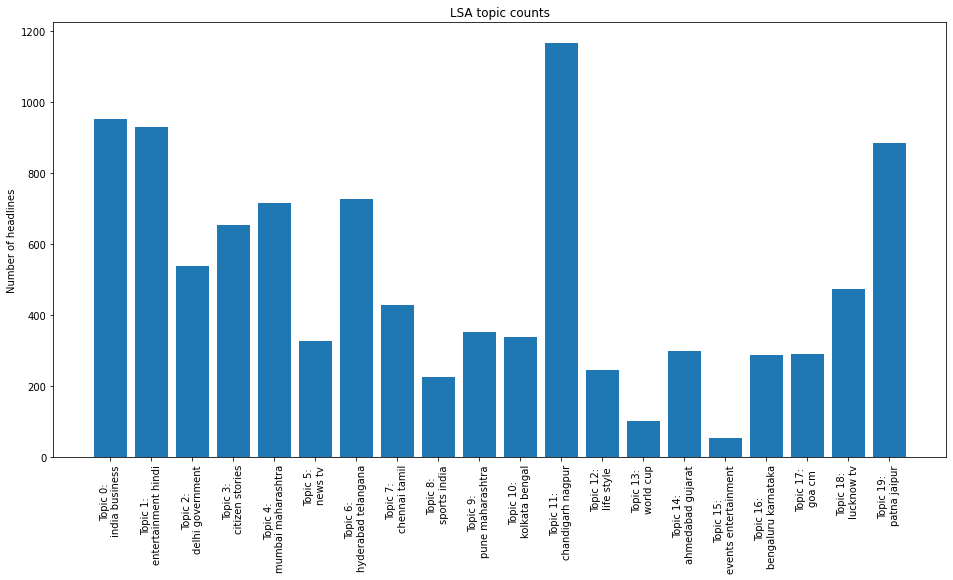

In [288]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [289]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 8.101s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.016835
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.361412
[t-SNE] KL divergence after 2000 iterations: 0.620960


In [290]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [291]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [292]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [293]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [294]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [295]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india business sports cricket says west indies news south bank
Topic 2:  citizen stories road nashik garbage parking water mangaluru footpath open
Topic 3:  tamil news nadu dehradun gadgets chennai man mumbai arrested india
Topic 4:  aurangabad cm india delhi maharashtra jaipur new sports pune chandigarh
Topic 5:  entertainment hindi bollywood news tv kapoor khan kannada boss bigg
Topic 6:  kolkata visakhapatnam bjp vadodara india cops minister hyderabad chief delhi
Topic 7:  life style spotlight health fashion news fitness india goa weight
Topic 8:  entertainment events world kochi cup day icc music sports cricket
Topic 9:  hyderabad bengaluru year old gurgaon man woman held rain agra
Topic 10:  ahmedabad gujarat india bhubaneswar years case ludhiana shah amit chandigarh
Topic 11:  delhi home nagpur education surat mysuru hubballi karnataka says govt
Topic 12:  noida vijayawada india traffic school bengaluru cops plan illegal meet
Topic 13:  pune goa today india horoscope rs

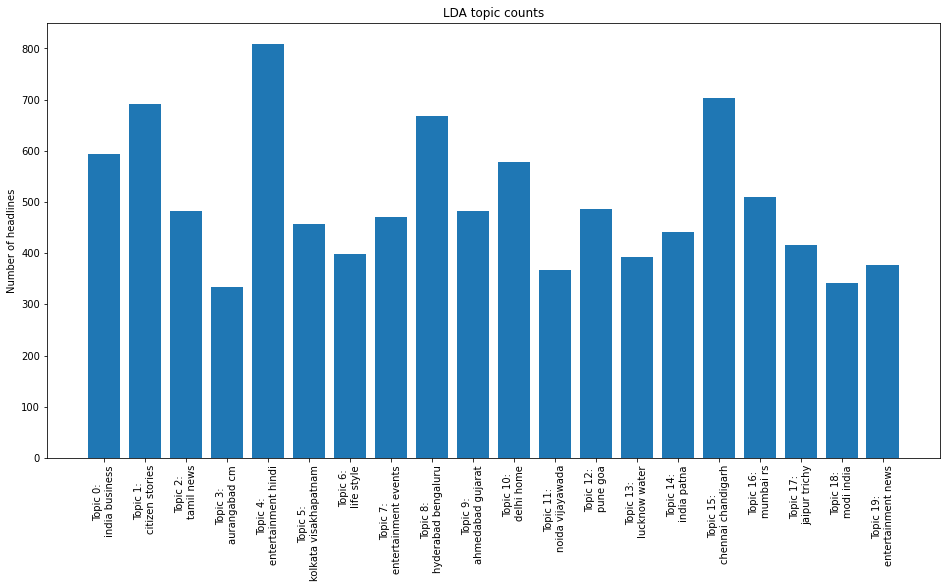

In [296]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [297]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.632s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.112805
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.382355
[t-SNE] KL divergence after 2000 iterations: 1.896713


In [298]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 24**

In [333]:
num_topics=24

In [334]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [335]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [336]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [337]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
11     -20.378456   56.508179       1        1  6.852047
2       79.288132   55.085800       2        1  5.629718
12      24.843275 -105.786751       3        1  5.509449
9       68.428604 -105.014183       4        1  5.387369
16      63.920837  -65.888359       5        1  4.989528
13      -8.527571  -64.856720       6        1  4.734980
1      -44.620640   19.916088       7        1  4.523207
5      -51.527081  -65.695885       8        1  4.489298
20      28.444641   -0.991994       9        1  4.434759
8       46.059116  -32.587276      10        1  4.425499
0      -19.095766 -102.703110      11        1  4.069567
4       66.543289    0.439861      12        1  4.023994
18      10.283104  -32.111134      13        1  3.978830
15     105.215370  -69.337166      14        1  3.917687
19     101.493652   17.312735      15        1  3.802413
17      29.093925   69.324188      16        1  3.749633
6       83.500191  -31.919847      17        1  3.606553
14      27.703207  -66.838219      18        1  3.453783
23     -10.297263    1.008217      19        1  3.364646
7      121.085579  -21.976244      20        1  3.341441
21     -27.011166  -31.074713      21        1  3.092639
10       9.422237   31.422739      22        1  2.960614
22      47.972301   31.643976      23        1  2.947284
3      -63.942307  -18.833242      24        1  2.715063, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  7100.000000  7100.000000  Default  30.0000  30.0000
3684           delhi  5033.000000  5033.000000  Default  29.0000  29.0000
4599   entertainment  6636.000000  6636.000000  Default  28.0000  28.0000
9138          mumbai  3859.000000  3859.000000  Default  27.0000  27.0000
6498       hyderabad  3349.000000  3349.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
9175         musical    79.765805    80.695251  Topic24  -5.1538   3.5948
15712         youths    78.424796    79.354242  Topic24  -5.1707   3.5946
2532           check   180.410868   247.269894  Topic24  -4.3376   3.2911
12121              s   152.505653  7574.044447  Topic24  -4.5057  -0.2989
14413          today   111.522301   941.910005  Topic24  -4.8186   1.4727

[798 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
22         3  0.989903       1st
39         4  0.988803       2nd
205       12  0.994794  accident
225       11  0.995140   accused
252       23  0.995815       act
...      ...       ...       ...
15685      7  0.676762      year
15687     19  0.999393     years
15702     16  0.993873      yogi
15711      5  0.996488     youth
15712     24  0.982934    youths

[780 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[12, 3, 13, 10, 17, 14, 2, 6, 21, 9, 1, 5, 19, 16, 20, 18, 7, 15, 24, 8, 22, 11, 23, 4])

In [338]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['days', 'hit', 'trichy', 'rain', 'singh', 'case', 's', 'woman', 'police', 'bjp']


Top 10 words for topic #1:
['gandhi', 'kids', 'telangana', 'old', 's', 'set', 'year', 'events', 'ahmedabad', 'hyderabad']


Top 10 words for topic #2:
['gadgets', 'photos', 'telugu', 'karnataka', 'hindi', 's', 'tv', 'news', 'lucknow', 'bengaluru']


Top 10 words for topic #3:
['support', 'child', 'hold', 'dies', 'happy', 'drive', 'indore', 'punjab', 'agra', 'school']


Top 10 words for topic #4:
['power', 'people', 'pradesh', 'make', 'nashik', 'meet', 'court', 'vijayawada', 'high', 'says']


Top 10 words for topic #5:
['special', 'food', 'team', 'spotlight', 'health', 'women', 's', 'home', 'style', 'life']


Top 10 words for topic #6:
['visit', 'party', 'diwali', 'soon', 'pm', 'modi', 'dehradun', 'cm', 'maharashtra', 'government']


Top 10 words for topic #7:
['doctors', 'theatre', 'big', 'play', 'english', 'house', 'traffic', 'open', 'congress', 'bhopal']


Top 10 words for topic #8:
['elections', 'sc'

In [339]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [340]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,22
1,bhujbal says higher power rate driving industr...,Negative,4
2,mandira bedi shares a monochrome picture in a ...,Negative,11
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,8
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,4
62960,going to india gate tonight? you could be in f...,Positive,12
62961,; cops to ensure safe new year celebrations in...,Positive,15
62962,ten more private trains from mumbai on cards m...,Positive,13


In [341]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [342]:
df_topic.Topic = df_topic.Topic.astype(str)


In [343]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [344]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_24.csv', index = False, encoding='utf-8')

# **LSA**

In [345]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [346]:
reindexed_data=df_news.text
n_topics=num_topics

In [347]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [348]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [349]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [350]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [351]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [352]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [353]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp today sc
Topic 2:  entertainment hindi bollywood news movies kapoor kannada music tamil khan
Topic 3:  delhi government high court air man new metro aap kejriwal
Topic 4:  citizen stories road water garbage parking footpath traffic near open
Topic 5:  mumbai maharashtra rs held bjp hc bombay case rain sena
Topic 6:  news tv gadgets kannada tamil telugu boss update bigg cricket
Topic 7:  hyderabad telangana entertainment events bjp congress govt rao police woman
Topic 8:  chennai tamil nadu madras water hc court high rain rs
Topic 9:  sports india cricket says world cup icc south west vs
Topic 10:  pune maharashtra rs man year rain water woman new flood
Topic 11:  kolkata bengal west cops puja new lake metro held airport
Topic 12:  chandigarh punjab home haryana education students body civic gurgaon government
Topic 13:  life style spotlight fashion health fitness news food weight celeb
Topic 14:  world cup icc sports cricket pakistan say

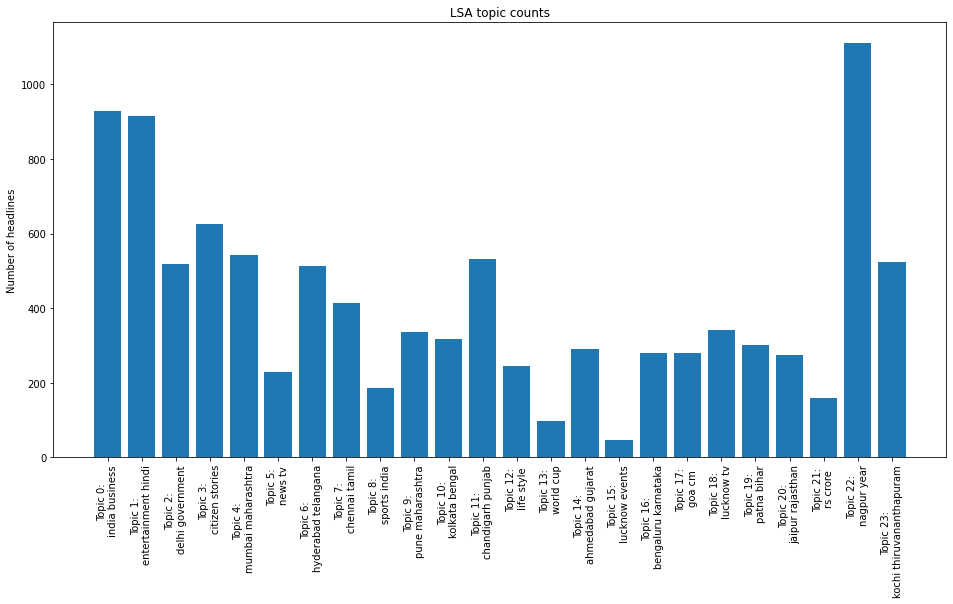

In [354]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [355]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 6.902s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.020670
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.299843
[t-SNE] KL divergence after 2000 iterations: 0.582130


In [356]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [357]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5",
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [358]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [359]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [360]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [361]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india nagpur modi pm surat narendra kolkata varanasi gets bengal
Topic 2:  style life goa nashik health fitness fashion spotlight news weight
Topic 3:  hyderabad india bjp telangana hc says chief mumbai minister bombay
Topic 4:  visakhapatnam gurgaon madurai gurugram india cops centre delhi air plan
Topic 5:  world cricket sports cup icc entertainment music india day pakistan
Topic 6:  india ghaziabad free business civic mumbai pune hyderabad booked chennai
Topic 7:  entertainment movies news tamil kannada bengali film telugu mysuru malayalam
Topic 8:  meerut bareilly body mumbai pune youth murder schools chennai hyderabad
Topic 9:  rs crore worth mumbai govt hyderabad kozhikode pune held seized
Topic 10:  citizen stories road hyderabad news gadgets new parking garbage water
Topic 11:  delhi tamil nadu noida chennai mangaluru government agra cops man
Topic 12:  sports vijayawada india years win tennis mumbai delhi chess chennai
Topic 13:  business india pune entertainment eve

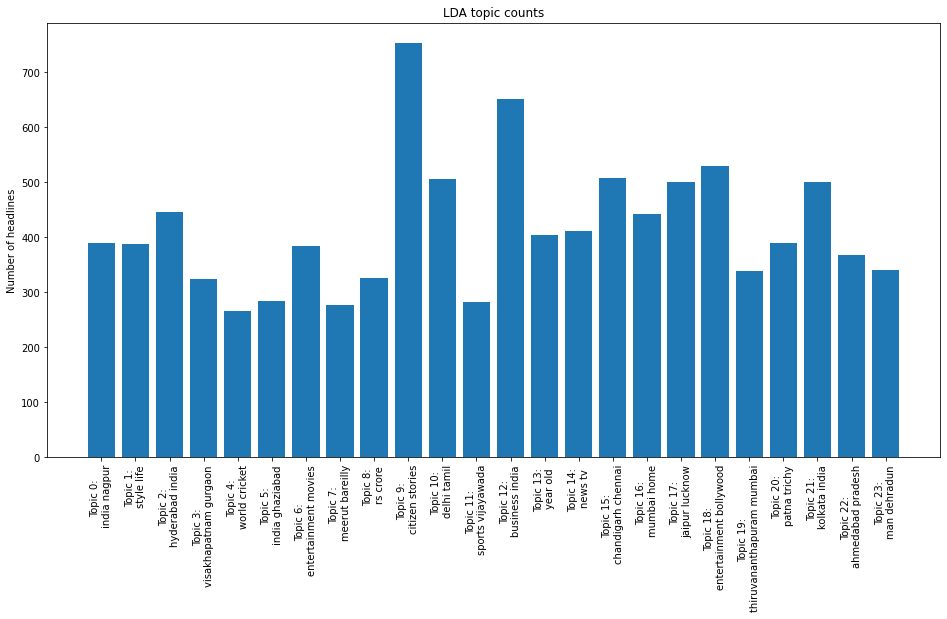

In [362]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [363]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 4.237s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.116364
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.605927
[t-SNE] KL divergence after 2000 iterations: 1.930732


In [364]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 28**

In [365]:
num_topics=28

In [366]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [367]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [368]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [369]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=               x          y  topics  cluster      Freq
topic                                                 
6     -35.920391   5.769703       1        1  7.612116
12      1.988841 -19.403000       2        1  6.532149
3     -23.625774  14.793219       3        1  4.981338
2     -34.465935  27.177048       4        1  4.396219
1      27.785280 -20.888374       5        1  4.239326
26     14.286076 -10.480253       6        1  4.039320
16     27.172379  17.179697       7        1  3.786715
5       1.163713  -2.151485       8        1  3.769243
15    -10.860936  23.085304       9        1  3.554304
8     -10.808557 -27.496380      10        1  3.484473
11    -22.619976  -2.281211      11        1  3.412469
25     30.179541  -1.951640      12        1  3.401533
14     14.334829   6.127186      13        1  3.340995
13     -1.200807  37.302486      14        1  3.311571
24     13.527594 -31.296890      15        1  3.222248
27    -20.354294  37.306385      16        1  3.217947
9       1.876337  14.808368      17        1  3.200523
10     12.697803  27.152449      18        1  3.123564
19    -33.551891 -31.895514      19        1  3.032299
0      -0.522432 -41.166050      20        1  2.954332
4     -48.312859 -22.134386      21        1  2.946187
17    -10.570119 -10.605622      22        1  2.900966
20    -35.887199 -10.706888      23        1  2.771371
18    -48.817703  16.620855      24        1  2.664235
21    -19.671886 -42.137867      25        1  2.658002
22    -10.836610   6.292932      26        1  2.652414
7     -51.757286  -2.756173      27        1  2.498347
23    -23.315453 -19.068462      28        1  2.295792, topic_info=                Term         Freq        Total Category  logprob  loglift
6689           india  6923.000000  6923.000000  Default  30.0000  30.0000
4599   entertainment  6216.000000  6216.000000  Default  29.0000  29.0000
3684           delhi  4900.000000  4900.000000  Default  28.0000  28.0000
9138          mumbai  3668.000000  3668.000000  Default  27.0000  27.0000
6498       hyderabad  3429.000000  3429.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
2906       commuters    75.197574    76.137096  Topic28  -5.0450   3.7617
6453            huge    70.441140    71.380662  Topic28  -5.1103   3.7608
14867         unique    70.351439    71.290961  Topic28  -5.1116   3.7608
14599      treatment    69.510916    70.450439  Topic28  -5.1236   3.7607
15580          woman   162.726405   859.767726  Topic28  -4.2731   2.1095

[910 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
39        27  0.994728       2nd
205       19  0.997025  accident
225       16  0.995848   accused
252        5  0.996501       act
255       10  0.998048    action
...      ...       ...       ...
15687     22  0.999022     years
15702     22  0.994310      yogi
15707     27  0.988541     young
15711      4  0.997443     youth
15747     23  0.985763      zone

[887 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 13, 4, 3, 2, 27, 17, 6, 16, 9, 12, 26, 15, 14, 25, 28, 10, 11, 20, 1, 5, 18, 21, 19, 22, 23, 8, 24])

In [370]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['want', 'ram', 'officials', 'private', 'plans', 'days', 'state', 'govt', 'rain', 'thiruvananthapuram']


Top 10 words for topic #1:
['free', 'win', 'shah', 'airport', 'power', 'pradesh', 'people', 's', 'new', 'delhi']


Top 10 words for topic #2:
['bigg', 'college', 'boss', 'trichy', 's', 'telugu', 'hindi', 'tv', 'goa', 'news']


Top 10 words for topic #3:
['varanasi', 'karnataka', 'rajasthan', 'lakh', 'cops', 'crore', 'rs', 'jaipur', 'bengaluru', 'pune']


Top 10 words for topic #4:
['october', 'months', 'ayodhya', 'president', 'diwali', 'family', 'bihar', 'soon', 'meet', 'patna']


Top 10 words for topic #5:
['way', 'food', 'team', 'spotlight', 's', 'health', 'women', 'set', 'style', 'life']


Top 10 words for topic #6:
['shares', 'english', 'kapoor', 'khan', 'kannada', 'events', 's', 'bollywood', 'hindi', 'entertainment']


Top 10 words for topic #7:
['class', 'global', 'december', 'building', 'away', 'big', 'near', 'rajkot', 'nashik', 'says']


Top 10 words for topic #8:
['probe',

In [371]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [372]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,1
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,6
3,harassment in office dm seeks action taken re...,Negative,8
4,two students end their lives mumbai,Negative,11
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,11
62960,going to india gate tonight? you could be in f...,Positive,1
62961,; cops to ensure safe new year celebrations in...,Positive,25
62962,ten more private trains from mumbai on cards m...,Positive,25


In [373]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [374]:
df_topic.Topic = df_topic.Topic.astype(str)


In [375]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [376]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_28.csv', index = False, encoding='utf-8')

# **LSA**

In [377]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [378]:
reindexed_data=df_news.text
n_topics=num_topics

In [379]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [380]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [381]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [382]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [383]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [384]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [385]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp sc today
Topic 2:  entertainment hindi bollywood news movies kapoor kannada music tamil khan
Topic 3:  delhi government court high air man new kejriwal metro aap
Topic 4:  citizen stories road garbage parking footpath water traffic near open
Topic 5:  mumbai maharashtra rs held bombay case hc rain bmc bjp
Topic 6:  news tv gadgets kannada telugu boss bigg update cricket sports
Topic 7:  hyderabad telangana entertainment events rao bjp held woman trs new
Topic 8:  chennai tamil nadu madras water hc court rs high students
Topic 9:  sports india cricket world cup icc vs south indies west
Topic 10:  pune maharashtra rs man year rain water woman new flood
Topic 11:  kolkata bengal west puja new cops lake metro held year
Topic 12:  chandigarh punjab haryana mohali singh rs assembly food days gets
Topic 13:  style life spotlight fashion health fitness news food weight celeb
Topic 14:  world cup icc sports cricket pakistan vs says zealand rest
T

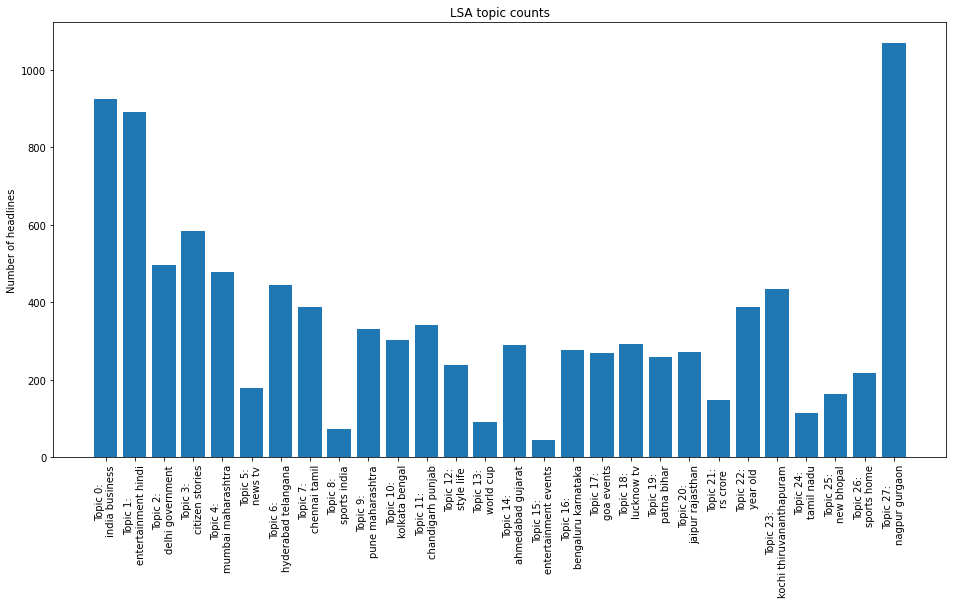

In [386]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [387]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.002s...
[t-SNE] Computed neighbors for 10000 samples in 6.850s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.024308
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.826694
[t-SNE] KL divergence after 2000 iterations: 0.546510


In [388]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [389]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5",
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [390]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [391]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [392]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [393]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  nagpur rs lakh mumbai india chennai booked held bribe cop
Topic 2:  thane sports indian india mumbai football chess local league station
Topic 3:  kochi pradesh vijayawada andhra madhya bhopal lucknow uttar reddy india
Topic 4:  india kozhikode indore traffic illegal son ex pune ap bengaluru
Topic 5:  entertainment hindi bollywood kapoor khan news picture shares singh photos
Topic 6:  patna bihar ghaziabad university kumar nitish new delhi cm government
Topic 7:  style life spotlight fashion man delhi ludhiana home celeb bareilly
Topic 8:  delhi india entertainment metro english today government hollywood south gets
Topic 9:  hyderabad news gadgets telangana congress india madurai rain centre heavy
Topic 10:  citizen stories road garbage parking footpath water accident open near
Topic 11:  mysuru government karnataka india says delhi bengaluru kolkata chennai citizenship
Topic 12:  kolkata sports noida cricket india home west education news cops
Topic 13:  entertainment news 

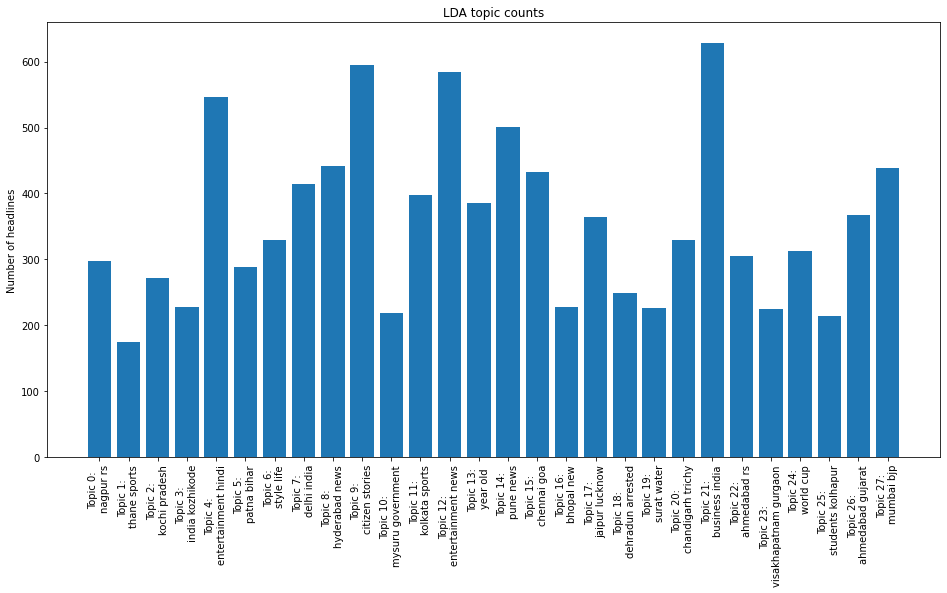

In [394]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [395]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.393s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.120800
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.852684
[t-SNE] KL divergence after 2000 iterations: 1.955153


In [396]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 32**

In [397]:
num_topics=32

In [398]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [399]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [400]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [401]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
10     -59.346996  140.985001       1        1  5.607223
9       13.573593  151.628067       2        1  5.370473
26     110.708603   -1.550020       3        1  5.291632
2      -19.409300  109.593430       4        1  5.260202
13     123.727043   52.347107       5        1  4.038486
16      83.013954   87.717834       6        1  3.938699
24    -116.482338   98.983002       7        1  3.629282
4       43.529011  117.163528       8        1  3.421907
28    -148.861649   24.376381       9        1  3.267638
29    -143.498001  -35.127403      10        1  3.198131
21      58.812729   -5.253480      11        1  3.197487
22     -55.515278 -120.850922      12        1  3.180730
1       24.337345   32.324036      13        1  3.103165
15     -20.746092   11.448237      14        1  3.082900
0     -108.472824  -90.889061      15        1  3.075880
18     -10.637972  -81.681488      16        1  3.075422
23     -59.602074   82.484390      17        1  3.041616
6        7.938844 -126.616043      18        1  2.826165
14      66.513443   39.245979      19        1  2.690195
11    -103.930122   52.602825      20        1  2.677969
3      -55.141838  -67.048943      21        1  2.637245
8      -22.285521   54.599186      22        1  2.624327
7       51.791161  -89.571724      23        1  2.596052
17      24.359377  -50.024506      24        1  2.436377
31     -61.554298   30.830980      25        1  2.401204
19     -92.318336  -41.789364      26        1  2.342640
25      80.520935  -50.272449      27        1  2.295287
12      17.878542   74.131615      28        1  2.238180
5       16.543386   -7.947008      29        1  2.089678
27     -20.790348  -35.273693      30        1  1.861301
20     -97.292526    2.718876      31        1  1.778198
30     -56.100136  -14.825083      32        1  1.724307, topic_info=                Term         Freq        Total Category  logprob  loglift
3684           delhi  5072.000000  5072.000000  Default  30.0000  30.0000
6689           india  7221.000000  7221.000000  Default  29.0000  29.0000
4599   entertainment  6398.000000  6398.000000  Default  28.0000  28.0000
9138          mumbai  3824.000000  3824.000000  Default  27.0000  27.0000
6498       hyderabad  3527.000000  3527.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
13803          sunny    58.668984    59.620402  Topic32  -5.0070   4.0443
3787          design    55.680492    56.631910  Topic32  -5.0592   4.0434
15535      wimbledon    55.209082    56.160500  Topic32  -5.0677   4.0433
9731          onions    51.801642    52.753060  Topic32  -5.1315   4.0421
2800         coastal    51.645336    52.596754  Topic32  -5.1345   4.0421

[1029 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
22        28  0.989044       1st
39        24  0.992294       2nd
114       20  0.990506       aap
191       31  0.977997        ac
205        8  0.993041  accident
...      ...       ...       ...
15702     24  0.994093      yogi
15707     25  0.990825     young
15711     11  0.997279     youth
15712     11  0.987968    youths
15747     27  0.989836      zone

[1004 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 10, 27, 3, 14, 17, 25, 5, 29, 30, 22, 23, 2, 16, 1, 19, 24, 7, 15, 12, 4, 9, 8, 18, 32, 20, 26, 13, 6, 28, 21, 31])

In [402]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['review', 'assembly', 'haryana', 'open', 'metro', 'rain', 'gurgaon', 'police', 'kochi', 'ahmedabad']


Top 10 words for topic #1:
['hospital', 'ex', 'son', 'visit', 'wife', 'takes', 'telangana', 'make', 's', 'hyderabad']


Top 10 words for topic #2:
['telugu', 'bengali', 'film', 'tamil', 'kannada', 'events', 's', 'movies', 'news', 'entertainment']


Top 10 words for topic #3:
['fake', 'u', 'use', 'bangalore', 'protest', 'park', 'photos', 'mysuru', 'karnataka', 'bengaluru']


Top 10 words for topic #4:
['say', 'killed', 'rajkot', 'power', 'hit', 'minister', 'nashik', 'meet', 'india', 'says']


Top 10 words for topic #5:
['workers', 'm', 'j', 'governor', 'medical', 'allahabad', 'happy', 'drive', 'punjab', 's']


Top 10 words for topic #6:
['parents', 'mark', 'couple', 'month', 'flood', 'bank', 'elections', 'win', 'maharashtra', 'mumbai']


Top 10 words for topic #7:
['list', 'dead', 'car', 'test', 'cop', 'green', 'free', 's', 'cops', 'day']


Top 10 words for topic #8:
['report', 'secur

In [403]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [404]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,28
1,bhujbal says higher power rate driving industr...,Negative,4
2,mandira bedi shares a monochrome picture in a ...,Negative,14
3,harassment in office dm seeks action taken re...,Negative,8
4,two students end their lives mumbai,Negative,24
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,5
62960,going to india gate tonight? you could be in f...,Positive,24
62961,; cops to ensure safe new year celebrations in...,Positive,6
62962,ten more private trains from mumbai on cards m...,Positive,6


In [405]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [406]:
df_topic.Topic = df_topic.Topic.astype(str)


In [407]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [408]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_32.csv', index = False, encoding='utf-8')

# **LSA**

In [409]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [410]:
reindexed_data=df_news.text
n_topics=num_topics

In [411]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [412]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [413]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [414]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [415]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [416]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [417]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp today sc
Topic 2:  entertainment hindi bollywood news movies kapoor kannada tamil music khan
Topic 3:  delhi government court high air man new kejriwal metro aap
Topic 4:  citizen stories road garbage parking footpath water traffic near open
Topic 5:  mumbai maharashtra rs held bombay case hc bjp bmc year
Topic 6:  news tv gadgets kannada telugu bigg boss update cricket sports
Topic 7:  hyderabad telangana entertainment events rao bjp held woman new trs
Topic 8:  chennai tamil nadu madras water court hc rs high students
Topic 9:  india sports cricket world cup icc south indies west vs
Topic 10:  pune maharashtra rs man rain year water woman new students
Topic 11:  kolkata bengal west puja cops new held metro lake day
Topic 12:  chandigarh punjab haryana mohali rs assembly singh civic gets days
Topic 13:  style life spotlight health fashion fitness news food weight celeb
Topic 14:  world cup icc sports cricket pakistan vs says new zealand

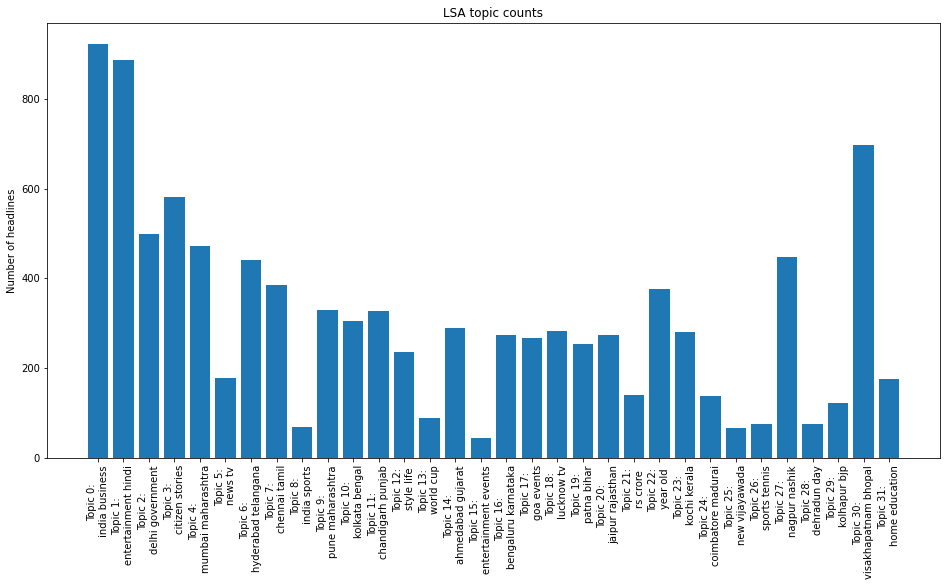

In [418]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [419]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 6.798s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.026787
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.419918
[t-SNE] KL divergence after 2000 iterations: 0.522482


In [420]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [421]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5",
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [422]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [423]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [424]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [425]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  business india goa case rs says bank new cm sc
Topic 2:  indian india stories citizen community hyderabad hockey jaipur flyover station
Topic 3:  vijayawada andhra pradesh govt india hyderabad water reddy rs nirmala
Topic 4:  meerut bareilly hubballi india body youth building guwahati murder says
Topic 5:  entertainment hindi bollywood kapoor khan music shares singh picture photos
Topic 6:  ahmedabad gujarat visakhapatnam pradesh madhya bhopal horoscope today rs india
Topic 7:  life style spotlight health fitness mysuru news fashion weight diet
Topic 8:  kochi gets delhi entertainment jonas hindi bollywood priyanka chopra jail
Topic 9:  chandigarh punjab madurai congress india pawar centre hit singh mumbai
Topic 10:  citizen stories road nagpur rs lakh garbage parking footpath water
Topic 11:  mumbai bombay held maharashtra best bmc rs india hc man
Topic 12:  year old noida vadodara woman girl dies mumbai police man
Topic 13:  chennai modi india pm narendra varanasi kolkata l

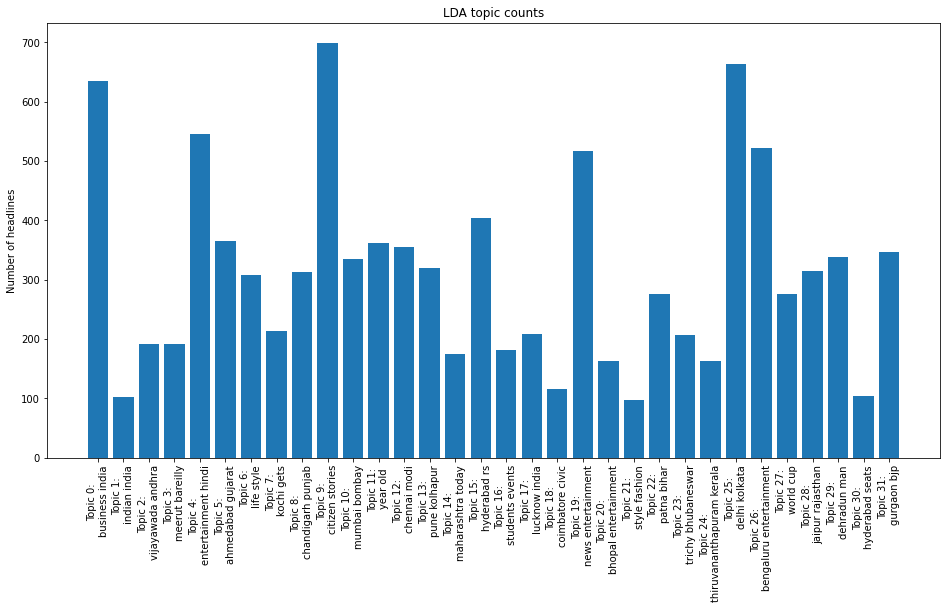

In [426]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [427]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.781s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.123121
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.064545
[t-SNE] KL divergence after 2000 iterations: 1.952343


In [428]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 36**

In [429]:
num_topics=36

In [430]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [431]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [432]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [433]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=               x          y  topics  cluster      Freq
topic                                                 
26     84.947281  35.948101       1        1  6.303650
30     70.878181  72.640923       2        1  6.005613
27     55.900009  56.375805       3        1  4.279789
19     27.525106  54.925270       4        1  3.762455
24    -73.352028  -2.113855       5        1  3.676960
17    -12.062783  59.373432       6        1  3.348615
33     41.017181  76.644951       7        1  3.275258
20     81.399879  15.275806       8        1  3.210646
8      79.069763 -21.586752       9        1  3.160582
22     49.025959  26.758705      10        1  3.122981
13     41.864223 -65.304642      11        1  3.048762
10     54.599216 -38.370766      12        1  2.972860
29    -19.280163 -65.453873      13        1  2.965777
5      11.067842 -73.335785      14        1  2.947400
16      4.430484  76.795349      15        1  2.942269
32    -40.209141  53.420742      16        1  2.757824
1      55.096451  -3.812229      17        1  2.681570
9     -26.027451 -11.454155      18        1  2.482086
0     -50.703163 -24.350807      19        1  2.478291
35    -48.835644 -55.623756      20        1  2.451894
3     -26.140589  29.732952      21        1  2.433451
7      20.248949  31.210167      22        1  2.383467
12    -31.670017 -35.584187      23        1  2.266981
11    -53.643574  25.778889      24        1  2.219507
28    -40.211555   4.992685      25        1  2.157908
18     -3.021356  33.514248      26        1  2.156091
31     25.109602 -41.406696      27        1  2.078072
15      0.963233 -45.920822      28        1  2.074349
2      -9.687140 -26.495378      29        1  2.004996
34     34.979382 -18.793884      30        1  1.978958
4      34.173275  11.254420      31        1  1.838331
14      6.653612  12.524317      32        1  1.797939
6      -2.308465  -6.394872      33        1  1.770859
25    -15.054240   9.503290      34        1  1.708359
21     18.833645  -4.190589      35        1  1.668592
23     11.331353 -23.007668      36        1  1.586859, topic_info=                Term         Freq        Total Category  logprob  loglift
12121              s  8218.000000  8218.000000  Default  30.0000  30.0000
3684           delhi  5482.000000  5482.000000  Default  29.0000  29.0000
6689           india  7601.000000  7601.000000  Default  28.0000  28.0000
4599   entertainment  7267.000000  7267.000000  Default  27.0000  27.0000
9138          mumbai  4075.000000  4075.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
14149         techie    56.841067    57.894588  Topic36  -4.9555   4.1250
15285          vizag    56.814425    57.867945  Topic36  -4.9560   4.1250
10800          pride    56.551547    57.605068  Topic36  -4.9607   4.1250
7675          kovind    53.849261    54.902782  Topic36  -5.0096   4.1240
3570             dec    53.367965    54.421486  Topic36  -5.0186   4.1239

[1148 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
22        27  0.994081      1st
39        24  0.991914      2nd
114       23  0.994782      aap
184       29  0.985597    abuse
194       32  0.982422  academy
...      ...       ...      ...
15702      6  0.996188     yogi
15707     24  0.987434    young
15711     13  0.997606    youth
15714     10  0.982207       yr
15747     24  0.986641     zone

[1124 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[27, 31, 28, 20, 25, 18, 34, 21, 9, 23, 14, 11, 30, 6, 17, 33, 2, 10, 1, 36, 4, 8, 13, 12, 29, 19, 32, 16, 3, 35, 5, 15, 7, 26, 22, 24])

In [434]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['market', 'security', 'accused', 'arrested', 'bhubaneswar', 'trichy', 'state', 'aurangabad', 'police', 'kochi']


Top 10 words for topic #1:
['parents', 'live', 'couple', 'rape', 'start', 'win', 'airport', 'telangana', 'thiruvananthapuram', 'hyderabad']


Top 10 words for topic #2:
['red', 'woman', 'officer', 'wedding', 'brings', 'footpath', 'join', 'e', 'held', 'ahmedabad']


Top 10 words for topic #3:
['mla', 'child', 'worth', 'booked', 'indore', 'varanasi', 'gujarat', 'lakh', 'crore', 'rs']


Top 10 words for topic #4:
['tiger', 'plastic', 'latest', 'save', 'man', 'office', 'garbage', 'wife', 'party', 'murder']


Top 10 words for topic #5:
['big', 'fashion', 'fitness', 'way', 'food', 'civic', 'spotlight', 'health', 'style', 'life']


Top 10 words for topic #6:
['money', 'ends', 'fine', 'doctor', 'areas', 'starts', 'month', 'hospital', 'family', 'meet']


Top 10 words for topic #7:
['dead', 'away', 'waste', 'car', 'gives', 'bus', 'cop', 'green', 'nashik', 'coimbatore']


Top 10 word

In [435]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [436]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,34
1,bhujbal says higher power rate driving industr...,Negative,7
2,mandira bedi shares a monochrome picture in a ...,Negative,18
3,harassment in office dm seeks action taken re...,Negative,8
4,two students end their lives mumbai,Negative,33
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,20
62960,going to india gate tonight? you could be in f...,Positive,10
62961,; cops to ensure safe new year celebrations in...,Positive,32
62962,ten more private trains from mumbai on cards m...,Positive,32


In [437]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [438]:
df_topic.Topic = df_topic.Topic.astype(str)


In [439]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [440]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_36.csv', index = False, encoding='utf-8')

# **LSA**

In [441]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [442]:
reindexed_data=df_news.text
n_topics=num_topics

In [443]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [444]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [445]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [446]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [447]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [448]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [449]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp today sc
Topic 2:  entertainment hindi bollywood news movies kapoor kannada tamil music khan
Topic 3:  delhi government court high air man new aap metro kejriwal
Topic 4:  citizen stories road garbage parking footpath water traffic open space
Topic 5:  mumbai maharashtra rs held bombay bjp bmc hc case crore
Topic 6:  news tv gadgets kannada telugu boss bigg update cricket sports
Topic 7:  hyderabad telangana events entertainment rao bjp held woman new trs
Topic 8:  chennai tamil nadu water madras hc rs students rain man
Topic 9:  india sports cricket world cup icc south vs indies west
Topic 10:  pune maharashtra rs man rain year woman water new road
Topic 11:  kolkata bengal west puja new cops lake held metro day
Topic 12:  chandigarh punjab haryana mohali rs singh body days food man
Topic 13:  style life spotlight fashion health fitness news weight food celeb
Topic 14:  world cup icc sports cricket pakistan vs zealand rest new
Topic 15:

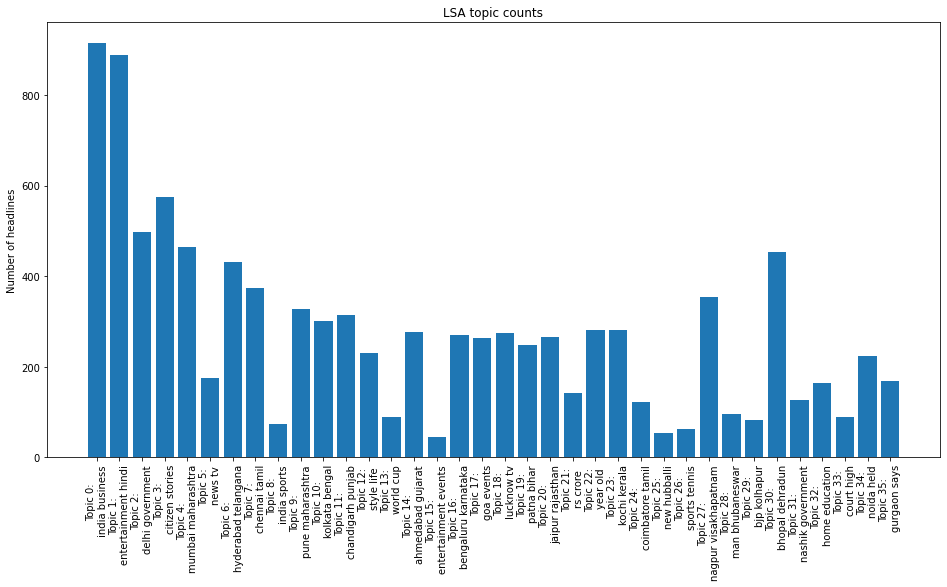

In [450]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [451]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 6.671s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.029475
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.595360
[t-SNE] KL divergence after 2000 iterations: 0.537538


In [452]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [453]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5",
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [454]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [455]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [456]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [457]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  india kolkata modi pm bengal narendra varanasi west adityanath yogi
Topic 2:  kochi water bhubaneswar road stories citizen odisha years thane ludhiana
Topic 3:  india business sports cricket world news cup icc gadgets says
Topic 4:  tv news hindi boss bigg update telugu written kannada india
Topic 5:  rain allahabad india minister heavy likely pune mumbai delhi chennai
Topic 6:  home education aurangabad sunday released result life ahmedabad delhi india
Topic 7:  hyderabad telangana man meerut rajkot bareilly held bjp case india
Topic 8:  mumbai maharashtra rs held bombay illegal metro pune rain bmc
Topic 9:  citizen stories hyderabad road parking footpath garbage water station railway
Topic 10:  style life health fashion spotlight fitness news weight celeb food
Topic 11:  india congress government mysuru madurai karnataka pawar says centre bengaluru
Topic 12:  lucknow noida trichy vijayawada ghaziabad cops girl kanpur shah amit
Topic 13:  surat goes delhi plastic campaign in

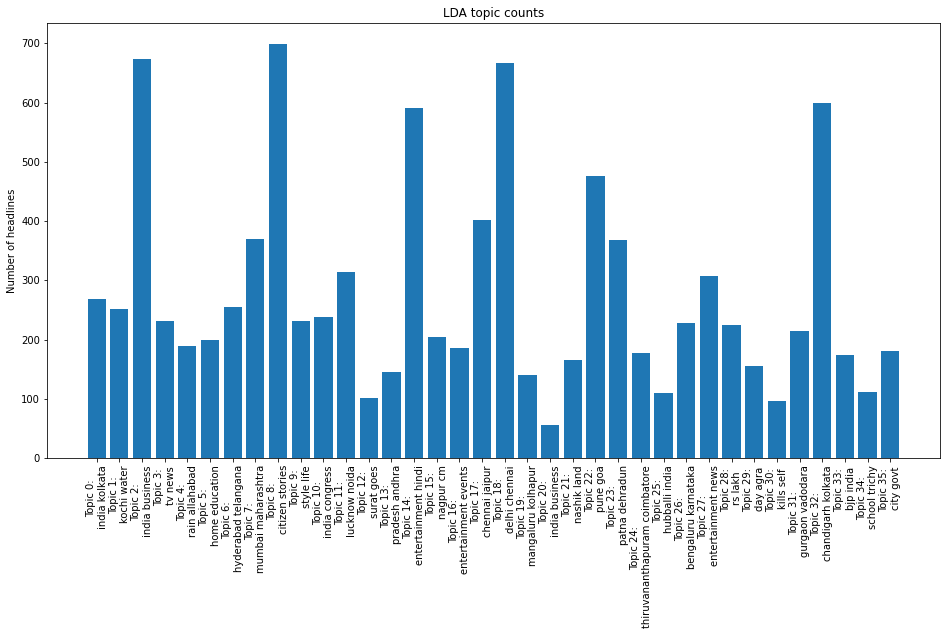

In [458]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [459]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.785s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.122711
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.298897
[t-SNE] KL divergence after 2000 iterations: 2.156151


In [460]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)

# **Topic Modeling 40**

In [461]:
num_topics=40

In [462]:
#create a document-term matrix to create vocabulary of all the words in tweets data
#Each of 52615 documents is represented as 5000 dimensional vectors, which means that our vocabulary has 5000 words.

from sklearn.decomposition import LatentDirichletAllocation
vectorizer = CountVectorizer(
analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{1,}',# num chars > 3
max_features=40000,# max number of unique words
                            )
data_matrix = vectorizer.fit_transform(df_news.text)
data_matrix

<62964x15757 sparse matrix of type '<class 'numpy.int64'>'
	with 488595 stored elements in Compressed Sparse Row format>

In [463]:
lda_model = LatentDirichletAllocation(
n_components=num_topics, # Number of topics
learning_method='online',
random_state=20,       
n_jobs = 1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_matrix)

In [464]:
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [465]:
# extract information from a fitted LDA topic model to inform an interactive web-based visualization

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distan

PreparedData(topic_coordinates=                x           y  topics  cluster      Freq
topic                                                   
39    -101.697083 -119.992714       1        1  5.223245
4       68.775230  -70.594589       2        1  5.000577
12     106.996643  -55.192417       3        1  4.198736
2      116.011765   97.889977       4        1  3.356233
37    -143.846725  -12.560599       5        1  3.281950
11       4.662229  193.838562       6        1  3.271036
26      85.249825  -20.308489       7        1  3.263377
25     -55.559540  -89.793266       8        1  3.098199
10      -3.757753 -144.700684       9        1  2.958026
18    -130.753799  -88.984581      10        1  2.949501
24     110.140640  152.620819      11        1  2.903895
19      61.303059  186.499725      12        1  2.796870
20    -147.166718   60.113586      13        1  2.677864
3      -95.522041   14.910711      14        1  2.676609
23      38.324909 -118.324265      15        1  2.665487
15     -56.726330 -137.804016      16        1  2.595928
32     -11.517457  -97.275955      17        1  2.591070
27     138.358597   38.630093      18        1  2.547234
30     -72.419121  -43.826115      19        1  2.541515
31      36.106995  134.982437      20        1  2.500426
9      125.208366 -110.393600      21        1  2.498614
17      71.653519   93.667152      22        1  2.336276
29    -118.060463  121.316925      23        1  2.321940
0      -28.188410  -54.527538      24        1  2.306239
14     -67.657104  166.042374      25        1  2.303812
8       74.346596   41.298080      26        1  2.252682
16     144.148911    2.928109      27        1  2.250783
34       5.696940  -30.994230      28        1  2.205232
38     -17.804014  138.909653      29        1  2.153458
36      18.206003  -72.209534      30        1  2.104762
22      37.542522    6.787146      31        1  2.095912
33     -90.576904   65.881638      32        1  1.916390
13     -64.324600  108.276840      33        1  1.749835
6      -48.159695   14.211741      34        1  1.469078
1       18.440355   92.553589      35        1  1.450466
5       -7.551638   20.260265      36        1  1.281127
7       26.383001   52.175175      37        1  1.151005
21     -23.914188   93.044868      38        1  1.083671
28     -10.867320   58.588776      39        1  0.992981
35     -46.645260   58.247536      40        1  0.977958, topic_info=                Term         Freq        Total Category  logprob  loglift
3684           delhi  5561.000000  5561.000000  Default  30.0000  30.0000
6689           india  7805.000000  7805.000000  Default  29.0000  29.0000
4599   entertainment  7517.000000  7517.000000  Default  28.0000  28.0000
9138          mumbai  4062.000000  4062.000000  Default  27.0000  27.0000
6498       hyderabad  3749.000000  3749.000000  Default  26.0000  26.0000
...              ...          ...          ...      ...      ...      ...
4159        donation    44.449658    45.529341  Topic40  -4.7174   4.6035
592        amarinder    43.559768    44.639451  Topic40  -4.7376   4.6030
7065            jain    43.142125    44.221808  Topic40  -4.7473   4.6027
10565           pond    39.679553    40.759236  Topic40  -4.8309   4.6006
13420          squad    39.645422    40.725105  Topic40  -4.8318   4.6006

[1274 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
22         1  0.993007       1st
39        22  0.989752       2nd
114       12  0.992602       aap
173       39  0.987693    abroad
205       30  0.993778  accident
...      ...       ...       ...
15707     37  0.994923     young
15711     24  0.995206     youth
15712     24  0.985212    youths
15714     15  0.985502        yr
15747     20  0.993392      zone

[1247 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[40, 5, 13, 3, 38, 12, 27, 26, 11, 19, 25, 20, 21, 4, 24, 16, 33, 28, 31, 32, 10, 18, 30, 1, 15, 9, 17, 

In [466]:
#keep the top 10 most frequent words from each topic that found by LDA

for i,topic in enumerate(lda_model.components_):
  print(f'Top 10 words for topic #{i}:')
  print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
  print('\n')

Top 10 words for topic #0:


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


['long', 'told', 'youth', 'near', 'college', 'rajkot', 'airport', 's', 'singh', 'goa']


Top 10 words for topic #1:
['killing', 'crime', 'tree', 'service', 'job', 'men', 'village', 'dead', 'car', 'aurangabad']


Top 10 words for topic #2:
['varanasi', 'meerut', 'kolhapur', 'agra', 'nashik', 'lakh', 'visakhapatnam', 'woman', 'rs', 'lucknow']


Top 10 words for topic #3:
['booked', 'tells', 'assembly', 'project', 'haryana', 'power', 'pradesh', 'vijayawada', 'high', 'court']


Top 10 words for topic #4:
['months', 'come', 'priyanka', 'sets', 'kanpur', 'english', 's', 'bollywood', 'hindi', 'entertainment']


Top 10 words for topic #5:
['growth', 'election', 'uk', 'attend', 'suicide', 'issue', 'calls', 'staff', 'award', 'begins']


Top 10 words for topic #6:
['messages', 'prices', 'friends', 'stations', 'release', 'injured', 'food', 'makes', 'gives', 'kozhikode']


Top 10 words for topic #7:
['share', 'reveals', 'officers', 'launches', 'photo', 'auto', 'vehicles', 'football', 'thane', 'pict

In [467]:
#add a new created topic column to the input dataframe and assign to each row ,based on the probability value, the suitable topic. To 
#find the topic index with maximum value, we can call the argmax() method and pass 1 as the value for the axis parameter.

topic_values = lda_model.transform(data_matrix)
df_news['Topic'] = topic_values.argmax(axis=1)

In [468]:
df_topic=df_news
df_topic

,text,target,Topic
0,mp to study new motor act before implementing ...,Negative,33
1,bhujbal says higher power rate driving industr...,Negative,2
2,mandira bedi shares a monochrome picture in a ...,Negative,10
3,harassment in office dm seeks action taken re...,Negative,2
4,two students end their lives mumbai,Negative,38
...,...,...,...
62959,cbi takes over probe in iit m 'suicide' case i...,Positive,18
62960,going to india gate tonight? you could be in f...,Positive,19
62961,; cops to ensure safe new year celebrations in...,Positive,11
62962,ten more private trains from mumbai on cards m...,Positive,11


In [469]:
df_topic.dtypes

text      object
target    object
Topic      int64
dtype: object

In [470]:
df_topic.Topic = df_topic.Topic.astype(str)


In [471]:
df_topic.dtypes

text      object
target    object
Topic     object
dtype: object

In [472]:
df_topic.to_csv('Dataset_For_Project/timesofindia_with_topic_40.csv', index = False, encoding='utf-8')

# **LSA**

In [473]:
from tqdm import tqdm
from collections import Counter
import ast
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()

%matplotlib inline

In [474]:
reindexed_data=df_news.text
n_topics=num_topics

In [475]:
small_count_vectorizer = CountVectorizer(stop_words='english', max_features=40000)
small_text_sample = reindexed_data.sample(n=10000, random_state=0).values

print('Headline before vectorization: {}'.format(small_text_sample[123]))

small_document_term_matrix = small_count_vectorizer.fit_transform(small_text_sample)

print('Headline after vectorization: \n{}'.format(small_document_term_matrix[123]))

Headline before vectorization: five girls escape from begusarai shelter home;  rescued patna
Headline after vectorization: 
  (0, 6138)	1
  (0, 11429)	1
  (0, 9916)	1
  (0, 5465)	1
  (0, 4505)	1
  (0, 1459)	1
  (0, 12471)	1


In [476]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [477]:
lsa_model = TruncatedSVD(n_components=n_topics)
lsa_topic_matrix = lsa_model.fit_transform(small_document_term_matrix)

In [478]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

In [479]:
lsa_keys = get_keys(lsa_topic_matrix)
lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

In [480]:
# Define helper functions
def get_top_n_words(n, keys, document_term_matrix, count_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
      topic_words = []
      for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = count_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
      top_words.append(" ".join(topic_words))         
    return top_words

In [481]:
top_n_words_lsa = get_top_n_words(10, lsa_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lsa)):
    print("Topic {}: ".format(i+1), top_n_words_lsa[i])

Topic 1:  india business modi pm says rs new bjp sc today
Topic 2:  entertainment hindi bollywood news movies kapoor kannada music tamil khan
Topic 3:  delhi government court high man new air aap kejriwal metro
Topic 4:  citizen stories road garbage footpath parking water traffic near space
Topic 5:  mumbai maharashtra rs held bombay hc bjp bmc year crore
Topic 6:  news tv gadgets kannada telugu bigg boss update cricket sports
Topic 7:  hyderabad telangana entertainment events rao bjp held woman congress trs
Topic 8:  chennai tamil nadu water madras hc rs students rain man
Topic 9:  india sports cricket world cup icc vs indies west south
Topic 10:  pune maharashtra rs man rain year woman new water lakh
Topic 11:  kolkata bengal west cops new puja metro held year woman
Topic 12:  chandigarh punjab haryana mohali rs assembly man singh gets elections
Topic 13:  style life spotlight fashion health fitness news food weight celeb
Topic 14:  world cup icc sports cricket pakistan vs says rest 

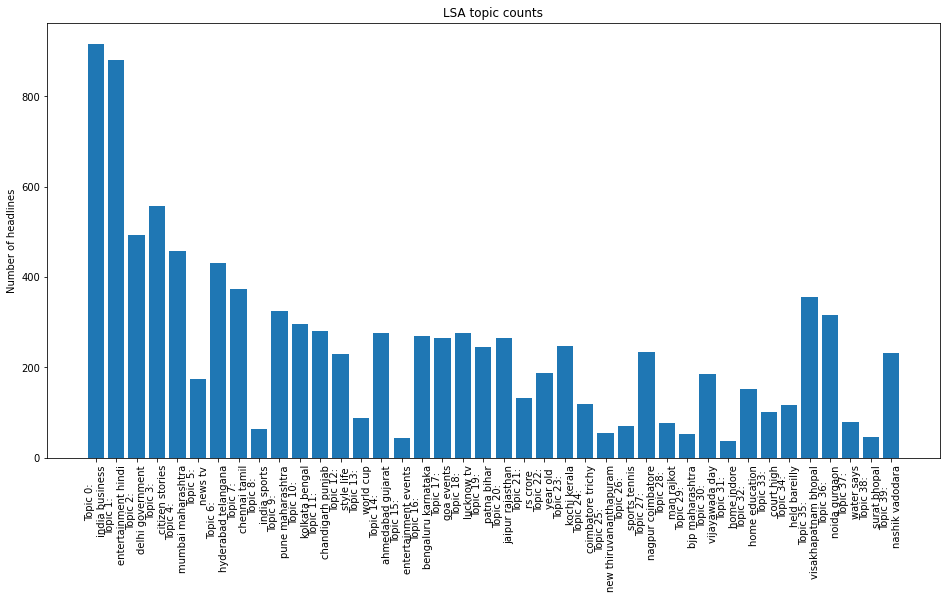

In [482]:
top_3_words = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lsa_categories]

fig, ax = plt.subplots(figsize=(16,8))

ax.bar(lsa_categories, lsa_counts);
ax.set_xticks(lsa_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_ylabel('Number of headlines');
ax.set_title('LSA topic counts');
plt.show()

In [483]:
tsne_lsa_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lsa_vectors = tsne_lsa_model.fit_transform(lsa_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 5.881s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.032601
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.712761
[t-SNE] KL divergence after 2000 iterations: 0.536506


In [484]:
# Define helper functions
def get_mean_topic_vectors(keys, two_dim_vectors):
    '''
    returns a list of centroid vectors from each predicted topic category
    '''
    mean_topic_vectors = []
    for t in range(n_topics):
        articles_in_that_topic = []
        for i in range(len(keys)):
            if keys[i] == t:
                articles_in_that_topic.append(two_dim_vectors[i])    
        
        articles_in_that_topic = np.vstack(articles_in_that_topic)
        mean_article_in_that_topic = np.mean(articles_in_that_topic, axis=0)
        mean_topic_vectors.append(mean_article_in_that_topic)
    return mean_topic_vectors

In [485]:
colormap = np.array([
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5",
    "#1f77b4", "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c",
    "#98df8a", "#d62728", "#ff9896", "#9467bd", "#c5b0d5",
    "#8c564b", "#c49c94", "#e377c2", "#f7b6d2", "#7f7f7f",
    "#c7c7c7", "#bcbd22", "#dbdb8d", "#17becf", "#9edae5" ])
colormap = colormap[:n_topics]

In [486]:
top_3_words_lsa = get_top_n_words(2, lsa_keys, small_document_term_matrix, small_count_vectorizer)
lsa_mean_topic_vectors = get_mean_topic_vectors(lsa_keys, tsne_lsa_vectors)

plot = figure(title="t-SNE Clustering of {} LSA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lsa_vectors[:,0], y=tsne_lsa_vectors[:,1], color=colormap[lsa_keys])

for t in range(n_topics):
    label = Label(x=lsa_mean_topic_vectors[t][0], y=lsa_mean_topic_vectors[t][1], 
                  text=top_3_words_lsa[t], text_color=colormap[t])
    plot.add_layout(label)
    
show(plot)

## **LDA**

In [487]:
lda_model = LatentDirichletAllocation(n_components=num_topics, learning_method='online', 
                                          random_state=0, verbose=0)
lda_topic_matrix = lda_model.fit_transform(small_document_term_matrix)

In [488]:
lda_keys = get_keys(lda_topic_matrix)
lda_categories, lda_counts = keys_to_counts(lda_keys)

In [489]:
top_n_words_lda = get_top_n_words(10, lda_keys, small_document_term_matrix, small_count_vectorizer)

for i in range(len(top_n_words_lda)):
    print("Topic {}: ".format(i+1), top_n_words_lda[i])

Topic 1:  modi pm kolkata india trichy agra ghaziabad bengal narendra west
Topic 2:  entertainment events hyderabad lucknow goa bangalore nagpur bengaluru evening musical
Topic 3:  kochi kerala police chandigarh thiruvananthapuram ernakulam india court official monsoon
Topic 4:  rs bjp crore surat mumbai bareilly india hyderabad cm worth
Topic 5:  held meerut open gang man temple chennai hyderabad amritsar jaipur
Topic 6:  india calls delhi development deal terror threat mumbai groups hyderabad
Topic 7:  dehradun man arrested rajkot murder wife delhi horoscope uttarakhand accused
Topic 8:  gets metro ranchi hyderabad green delhi kolkata tennis pune mumbai
Topic 9:  help india ayodhya verdict jail hyderabad battle inmates bring news
Topic 10:  citizen stories hyderabad road garbage new footpath parking water bhubaneswar
Topic 11:  india injured major kashmir mumbai army pune year forest jammu
Topic 12:  mumbai entertainment hindi bollywood indore priyanka bmc maharashtra held jonas
Topi

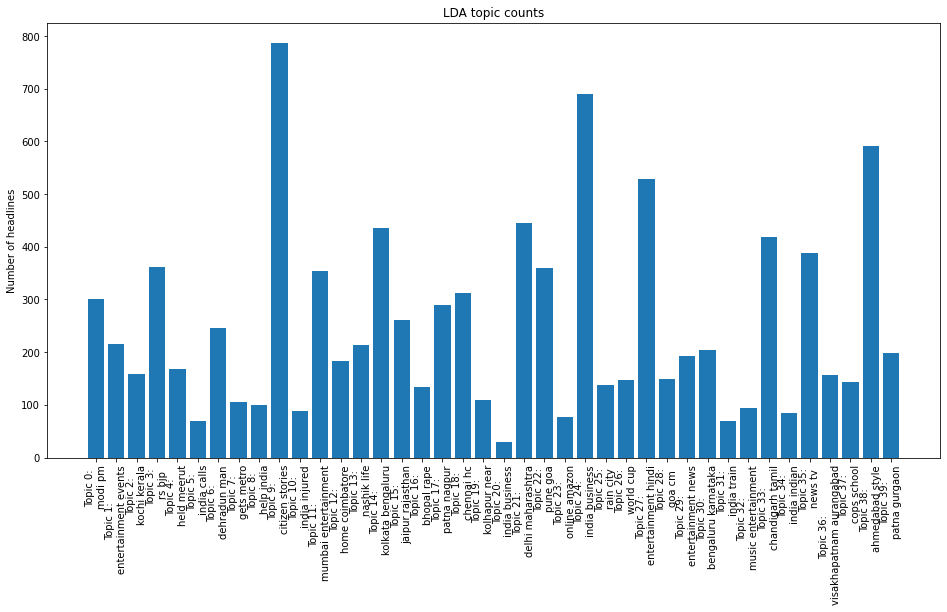

In [490]:
top_3_words = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in lda_categories]

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(lda_categories, lda_counts);
ax.set_xticks(lda_categories);
ax.set_xticklabels(labels,rotation='vertical');
ax.set_title('LDA topic counts');
ax.set_ylabel('Number of headlines');

In [491]:
tsne_lda_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=2000, verbose=1, random_state=0, angle=0.75)
tsne_lda_vectors = tsne_lda_model.fit_transform(lda_topic_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 3.619s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.125095
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.034248
[t-SNE] KL divergence after 2000 iterations: 2.258051


In [495]:
top_3_words_lda = get_top_n_words(2, lda_keys, small_document_term_matrix, small_count_vectorizer)
lda_mean_topic_vectors = get_mean_topic_vectors(lda_keys, tsne_lda_vectors)

plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), plot_width=900, plot_height=900)
plot.scatter(x=tsne_lda_vectors[:,0], y=tsne_lda_vectors[:,1], color=colormap[lda_keys])

for t in range(n_topics):
    label = Label(x=lda_mean_topic_vectors[t][0], y=lda_mean_topic_vectors[t][1], 
                  text=top_3_words_lda[t], text_color='black')
    plot.add_layout(label)

show(plot)